# Example usage notebook of the DD-GAN repo

In [1]:
import time
import numpy as np
import sklearn.preprocessing
import tensorflow as tf
import matplotlib.pyplot as plt
from copy import deepcopy

After installation of the ddgan package run the following line to import it

In [2]:
import ddgan
from ddgan import *

### Loading Data

In [3]:
nPOD = 10
nlatent = 100

evaluated_subdomains = 2
subdomains = 4
dims = 3

# Number of neighbour and self time values. 
# Corresponds to n = n_b, n_a, n_self
added_dims = [1,1,3]
# Cumulative sum
cumulative_dims = [0,1,2]
steps = added_dims[-1]

# Cut away some bootup values where nothing happens
start_from = 100
# Total number of datapoints
datapoints = 1800 + steps + 50
4
step_size = 4

t_begin = 0
t_end = 1800

debug = False
train = True
find_old_model = False
noise = False #False
epochs = 100 
n_gradient_ascent = 10


csv_data = np.load('../data/processed/DD/pod_coeffs_field_Velocity.npy', )

assert nPOD <= csv_data.shape[1], "Make sure the data includes enough POD coeffs"
assert datapoints + start_from <= csv_data.shape[2], "Not enough data"
assert evaluated_subdomains + 2 <= csv_data.shape[0], "Not enough domains"

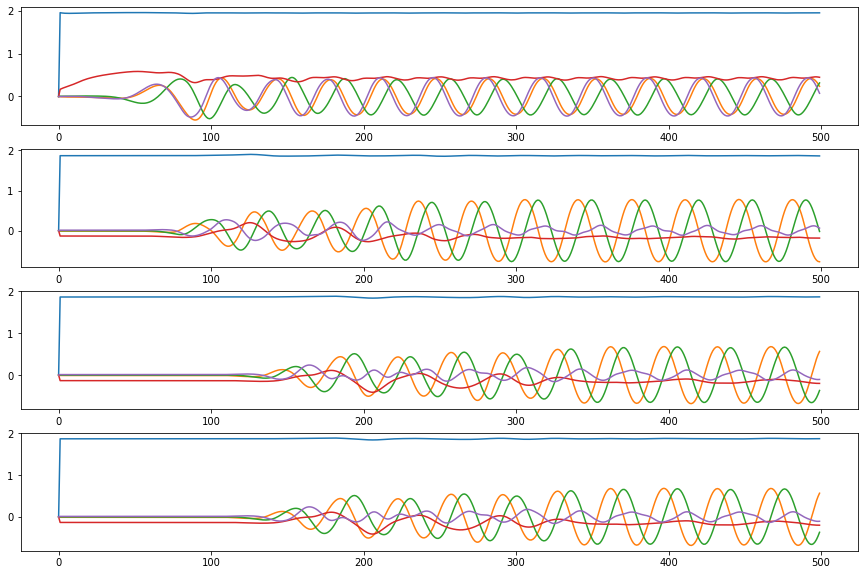

In [4]:
fig = plt.figure(figsize=(15, 9))
# The big subplot
ax = fig.add_subplot(111)

# Turn off axis lines and ticks of the big subplot
ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)


ax1 = fig.add_subplot(411)
ax1.set_title('Domain 1')
ax1.plot(np.linspace(0,125,500),csv_data[0,:5,:500].T)

ax1 = fig.add_subplot(412)
ax1.set_title('Domain 2')
ax1.plot(np.linspace(0,125,500),csv_data[1,:5,:500].T)

ax1 = fig.add_subplot(413)
ax1.set_title('Domain 3')
ax1.plot(np.linspace(0,125,500),csv_data[2,:5,:500].T)

ax1 = fig.add_subplot(414)
ax1.set_title('Domain 4')
ax1.plot(np.linspace(0,125,500),csv_data[3,:5,:500].T)
ax1.set_xlabel('Time',fontsize=14)
ax.set_ylabel('Value',fontsize=14)
plt.tight_layout()
plt.show()

In [5]:
# Cutting the dataset
print(csv_data.shape)
csv_data = csv_data[:subdomains,:nPOD,start_from:start_from+datapoints]
print(csv_data.shape)

(4, 10, 2000)
(4, 10, 1853)


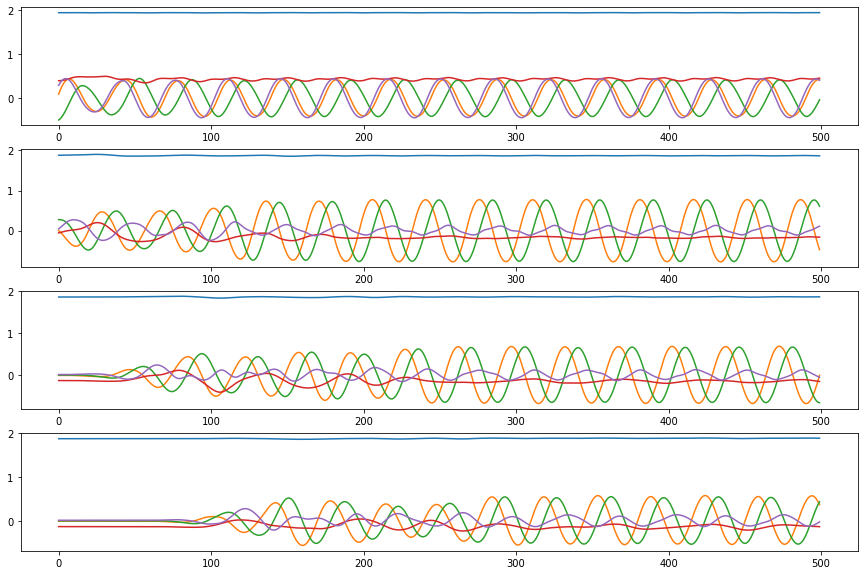

In [6]:
fig = plt.figure(figsize=(15, 9))
# The big subplot
ax = fig.add_subplot(111)

# Turn off axis lines and ticks of the big subplot
ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)


ax1 = fig.add_subplot(411)
ax1.set_title('Domain 1')
ax1.plot(np.linspace(0,125,500),csv_data[0,:5,:500].T)

ax1 = fig.add_subplot(412)
ax1.set_title('Domain 2')
ax1.plot(np.linspace(0,125,500),csv_data[1,:5,:500].T)

ax1 = fig.add_subplot(413)
ax1.set_title('Domain 3')
ax1.plot(np.linspace(0,125,500),csv_data[2,:5,:500].T)

ax1 = fig.add_subplot(414)
ax1.set_title('Domain 4')
ax1.plot(np.linspace(0,125,500),csv_data[3,:5,:500].T)
ax1.set_xlabel('Time',fontsize=14)
ax.set_ylabel('Value',fontsize=14)
plt.tight_layout()
plt.show()

In [7]:
# Transposing data
tmp_data = np.ones([subdomains, datapoints, nPOD])

# Making a dataset for debugging purposes
new_data = np.ones([subdomains, nPOD, datapoints])
for i in range(subdomains):
    for j in range(nPOD):
        for k in range(datapoints):
            new_data[i][j][k] = nPOD*j + (i + 1)*10000 + k  

for k in range(subdomains):
    tmp_data[k] = csv_data[k].T
    if debug:
        tmp_data[k] = new_data[k].T
    
csv_data = tmp_data
csv_data.shape

(4, 1853, 10)

In [8]:
# Scaling
scales = []
scaled_training = np.zeros_like(csv_data)
if debug is False:
    for i in range(subdomains):
        scales.append(sklearn.preprocessing.MinMaxScaler(feature_range=[-1,1]))
        scaled_training[i] = scales[i].fit_transform(csv_data[i])
if debug:
    scaled_training = csv_data

In [9]:
# Asserting scaling is accurate
if debug is False:
    cond = np.zeros_like(scaled_training)
    for i in range(subdomains):
        cond[i] = scales[i].inverse_transform(scaled_training[i])
    assert np.allclose(csv_data[0,:,0], cond[0,:,0]), "Scaling failed"  

    for dim in range(subdomains):
        for icol in range(nPOD):
            assert np.isclose(np.min(scaled_training[dim][:,icol]) + np.max(scaled_training[dim][:,icol]), 0), "Scaling failed" 

### Decomposing the data and ordering the samples

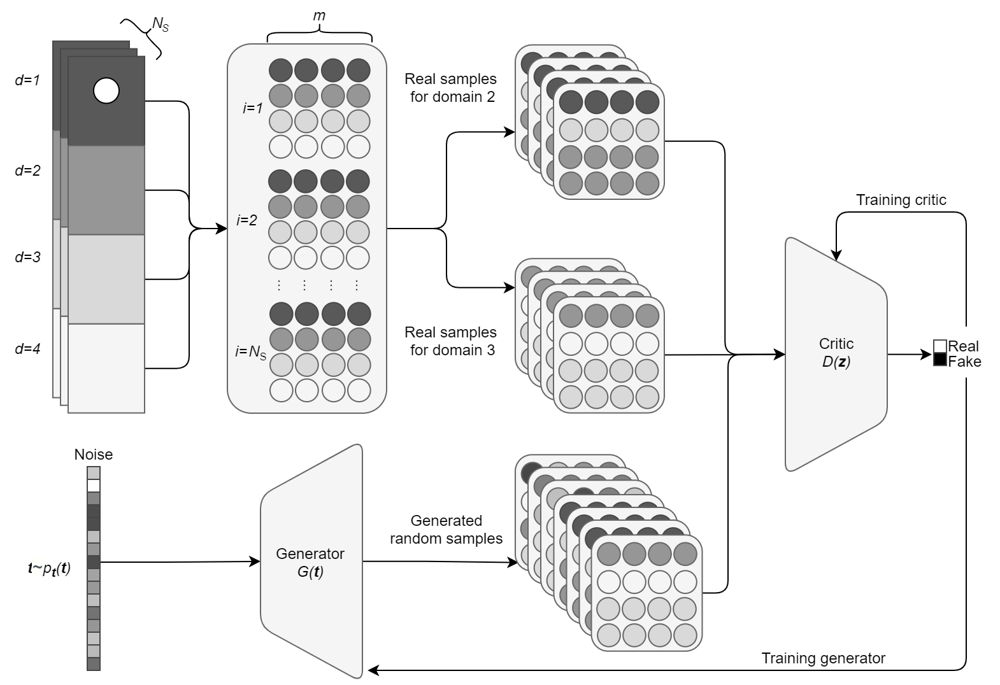

In [10]:
# Setting up the data into subdomains 
# 2 x nTrain x nsteps * nPOD *3 # 'float32' or np.float32

assert sum(added_dims[:-1]) == cumulative_dims[-1]

training_data = np.zeros((evaluated_subdomains, t_end, np.sum(added_dims * nPOD)), dtype=np.float32) 

# See image above on how the data is structured
# The ima
for domain in range(evaluated_subdomains): 
    for i, dim in enumerate([0,2,1]):
        for j, step in enumerate(range(steps-added_dims[i], steps)):
            training_data[domain, :, cumulative_dims[i]*nPOD + j*nPOD : cumulative_dims[i]*nPOD + (j+1)*nPOD] = scaled_training[dim + domain][t_begin+(step*step_size) : t_end+(step*step_size), :]

# Adding data for leftmost and rightmost domain
boundrary_conditions = []
boundrary_conditions.append(scaled_training[0, (steps-1)*step_size:])
boundrary_conditions.append(scaled_training[-1, (steps-1)*step_size:])

In [11]:
assert np.allclose(training_data[0,1,(added_dims[0]-1)*nPOD:added_dims[0]*nPOD], boundrary_conditions[0][1]), 'Check the boundrary condition data.'

In [12]:
joined_train_data = training_data.reshape((training_data.shape[1]*training_data.shape[0], training_data.shape[2]))

print(training_data.shape)
print(joined_train_data.shape)
print(tmp_data[0,steps-1:].shape)

(2, 1800, 50)
(3600, 50)
(1851, 10)


### Initializing GAN

In [13]:
kwargs = {
    "nsteps" : np.sum(added_dims),
    "ndims" : nPOD,
    "nLatent": nlatent,
    "batch_size" : 45,
    "batches" : 80,
    "seed" : 143,
    "epochs" : epochs,
    "noise" : noise,
    "n_gradient_ascent" : n_gradient_ascent,
    "logs_location" : './logs/gradient_tape/224/',
    "model_location" : 'models/224/'
}

gan = GAN(**kwargs)
gan.setup(find_old_model=find_old_model)
set_seed(gan.seed)

ndims_latent_input = gan.ndims
joined_train_data = np.float32(joined_train_data)
print('type and shape (nPOD by nTrain) of POD coeffs from csv file', type(joined_train_data), joined_train_data.shape, joined_train_data.dtype)

making new generator and critic
type and shape (nPOD by nTrain) of POD coeffs from csv file <class 'numpy.ndarray'> (3600, 50) float32


In [14]:
if train:
    # Load the TensorBoard notebook extension
    %load_ext tensorboard
    %tensorboard --logdir ./logs/gradient_tape/ --port 6008
    %reload_ext tensorboard

Reusing TensorBoard on port 6008 (pid 299), started 2 days, 17:54:52 ago. (Use '!kill 299' to kill it.)

In [15]:
if train:
    gan.learn_hypersurface_from_POD_coeffs(joined_train_data)

beginning training
epoch: 	 0
gen loss:  -0.0035637207 d loss:  9.414101 w_loss:  -0.0046951864
epoch: 	 1
gen loss:  -0.09077861 d loss:  4.1952567 w_loss:  -0.07947089
epoch: 	 2
gen loss:  -0.2120156 d loss:  2.5611181 w_loss:  -0.10285039
epoch: 	 3
gen loss:  -0.2801987 d loss:  1.9134419 w_loss:  -0.08776735
epoch: 	 4
gen loss:  -0.34169787 d loss:  1.3430262 w_loss:  -0.030937552
epoch: 	 5
gen loss:  -0.4325076 d loss:  1.0427374 w_loss:  0.03833266
epoch: 	 6
gen loss:  -0.5340558 d loss:  0.9559576 w_loss:  0.10453045
epoch: 	 7
gen loss:  -0.60238945 d loss:  0.92117226 w_loss:  0.1950444
epoch: 	 8
gen loss:  -0.65479743 d loss:  1.0484366 w_loss:  0.2775046
epoch: 	 9
gen loss:  -0.69422877 d loss:  0.87029743 w_loss:  0.32359734
epoch: 	 10
gen loss:  -0.74620646 d loss:  1.0699483 w_loss:  0.34946144
epoch: 	 11
gen loss:  -0.74011457 d loss:  1.1760089 w_loss:  0.39224535
epoch: 	 12
gen loss:  -0.7506418 d loss:  1.3426307 w_loss:  0.3482011
epoch: 	 13
gen loss:  -0.

### Starting a training/predicting loop

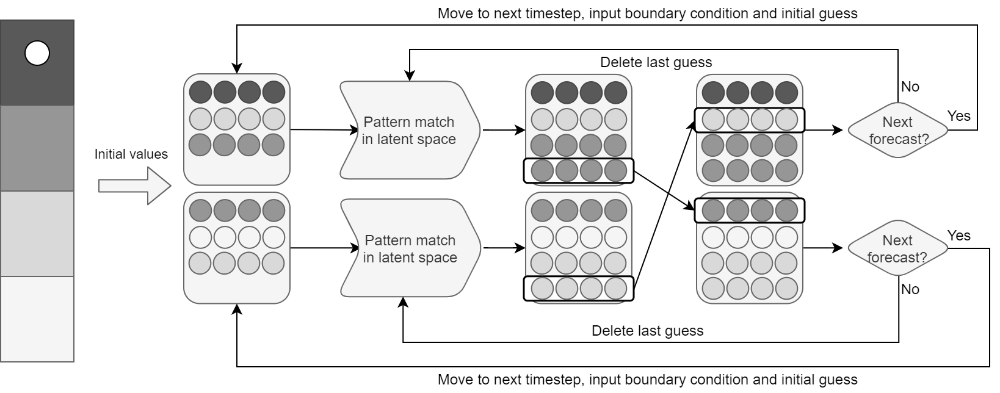

Time step: 	 0
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Do

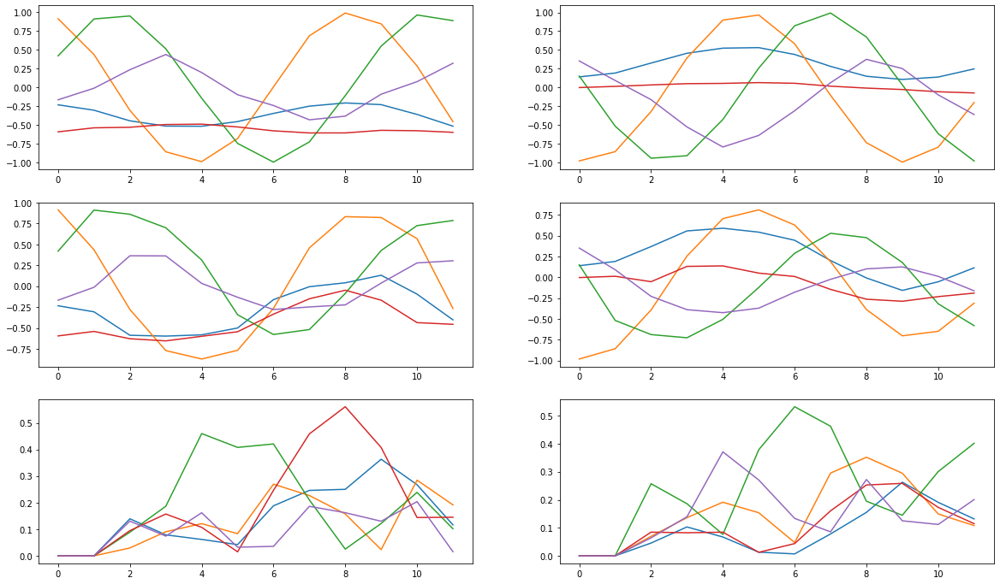

epoch: 	 0
gen loss:  -0.21412452 d loss:  0.2997145 w_loss:  0.073240764
epoch: 	 1
gen loss:  -0.15182196 d loss:  0.23739389 w_loss:  0.14996329
epoch: 	 2
gen loss:  -0.17604029 d loss:  0.30009285 w_loss:  0.07604256
epoch: 	 3
gen loss:  -0.2366571 d loss:  0.32956094 w_loss:  0.08245386
epoch: 	 4
gen loss:  -0.16794956 d loss:  0.3002375 w_loss:  0.07657839
epoch: 	 5
gen loss:  -0.16972308 d loss:  0.29726437 w_loss:  0.09075841
epoch: 	 6
gen loss:  -0.15844895 d loss:  0.2830571 w_loss:  0.114190936
epoch: 	 7
gen loss:  -0.1748816 d loss:  0.26468724 w_loss:  0.122727275
epoch: 	 8
gen loss:  -0.17130361 d loss:  0.2622737 w_loss:  0.11271802
epoch: 	 9
gen loss:  -0.16453351 d loss:  0.22990179 w_loss:  0.14707553
epoch: 	 10
gen loss:  -0.17811522 d loss:  0.26950103 w_loss:  0.093005456
epoch: 	 11
gen loss:  -0.17842127 d loss:  0.30327982 w_loss:  0.07379552
epoch: 	 12
gen loss:  -0.14206716 d loss:  0.28000402 w_loss:  0.102029085
epoch: 	 13
gen loss:  -0.20364404 d

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

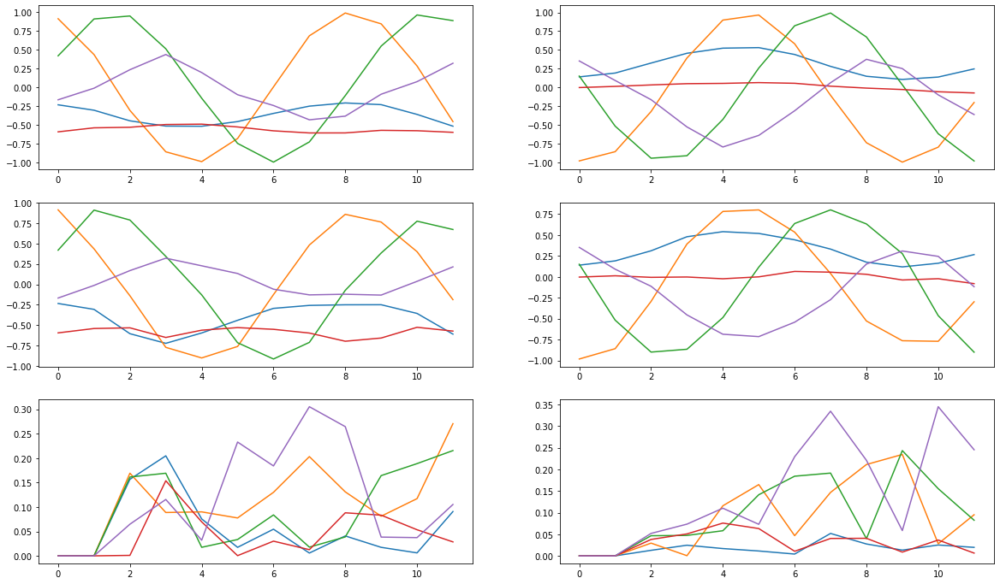

epoch: 	 0
gen loss:  -0.13649419 d loss:  0.11269158 w_loss:  0.05314661
epoch: 	 1
gen loss:  -0.16990167 d loss:  0.08598441 w_loss:  0.10432162
epoch: 	 2
gen loss:  -0.05826813 d loss:  0.08528523 w_loss:  0.08935943
epoch: 	 3
gen loss:  -0.14260535 d loss:  0.10739796 w_loss:  0.08965618
epoch: 	 4
gen loss:  -0.099348426 d loss:  0.044593595 w_loss:  0.14140046
epoch: 	 5
gen loss:  -0.09913761 d loss:  0.07143227 w_loss:  0.1065254
epoch: 	 6
gen loss:  -0.051942397 d loss:  0.14233962 w_loss:  0.028077379
epoch: 	 7
gen loss:  0.02041255 d loss:  0.051180102 w_loss:  0.10691074
epoch: 	 8
gen loss:  -0.020714397 d loss:  0.086154096 w_loss:  0.06591771
epoch: 	 9
gen loss:  -0.0649491 d loss:  0.13709642 w_loss:  0.04333616
epoch: 	 10
gen loss:  -0.069570996 d loss:  0.12594905 w_loss:  0.04848733
epoch: 	 11
gen loss:  -0.0040171565 d loss:  0.094613716 w_loss:  0.096125245
epoch: 	 12
gen loss:  -0.05588568 d loss:  0.0714358 w_loss:  0.101504944
epoch: 	 13
gen loss:  -0.

Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Do

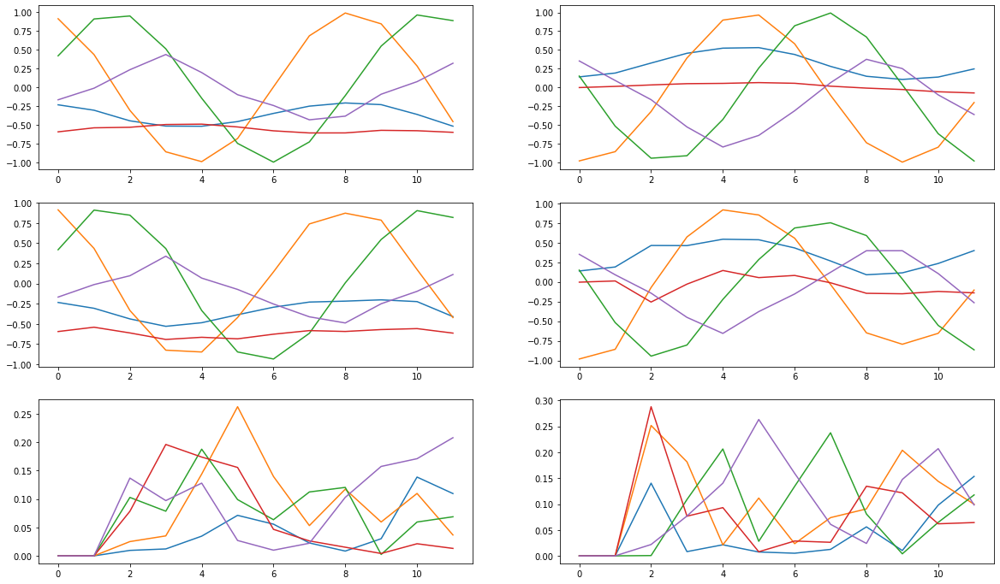

epoch: 	 0
gen loss:  0.08348848 d loss:  0.102169946 w_loss:  0.06868929
epoch: 	 1
gen loss:  0.009549648 d loss:  0.10967169 w_loss:  0.050363503
epoch: 	 2
gen loss:  -0.041858267 d loss:  0.11786586 w_loss:  0.04510057
epoch: 	 3
gen loss:  0.0055205263 d loss:  0.11916699 w_loss:  0.038748555
epoch: 	 4
gen loss:  -0.019307133 d loss:  0.13050523 w_loss:  0.012654036
epoch: 	 5
gen loss:  0.02659205 d loss:  0.15340252 w_loss:  0.017453136
epoch: 	 6
gen loss:  0.025318494 d loss:  0.039403826 w_loss:  0.11498715
epoch: 	 7
gen loss:  0.020817205 d loss:  0.11517644 w_loss:  0.037611134
epoch: 	 8
gen loss:  0.06465942 d loss:  0.09079526 w_loss:  0.058390994
epoch: 	 9
gen loss:  -0.020436656 d loss:  0.077921934 w_loss:  0.06860871
epoch: 	 10
gen loss:  0.02028517 d loss:  0.11715891 w_loss:  0.042768605
epoch: 	 11
gen loss:  -0.029040534 d loss:  0.07181327 w_loss:  0.086067714
epoch: 	 12
gen loss:  -0.045639932 d loss:  0.11461878 w_loss:  0.033480942
epoch: 	 13
gen loss:

Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

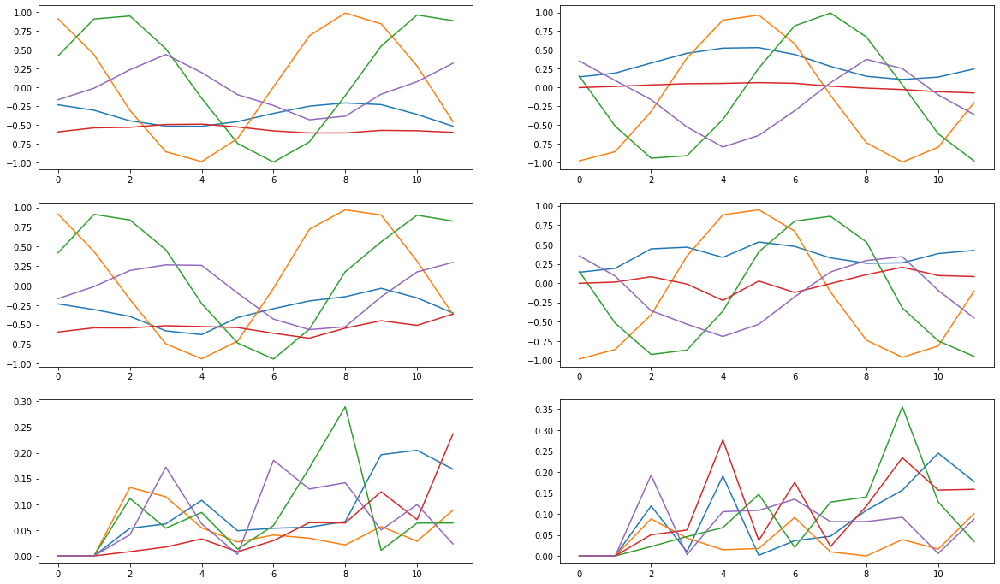

epoch: 	 0
gen loss:  0.081293456 d loss:  0.10043206 w_loss:  0.060484122
epoch: 	 1
gen loss:  0.12182397 d loss:  0.093762055 w_loss:  0.058388792
epoch: 	 2
gen loss:  0.0730729 d loss:  0.054877233 w_loss:  0.0946375
epoch: 	 3
gen loss:  0.10897082 d loss:  0.12397753 w_loss:  0.0261505
epoch: 	 4
gen loss:  0.052247338 d loss:  0.09251317 w_loss:  0.053373776
epoch: 	 5
gen loss:  0.082896225 d loss:  0.06493956 w_loss:  0.079112425
epoch: 	 6
gen loss:  0.10421809 d loss:  0.12199662 w_loss:  0.049785126
epoch: 	 7
gen loss:  0.10537662 d loss:  0.11200533 w_loss:  0.0564745
epoch: 	 8
gen loss:  0.099979654 d loss:  0.048570454 w_loss:  0.10526989
epoch: 	 9
gen loss:  0.10362899 d loss:  0.067607686 w_loss:  0.08343771
epoch: 	 10
gen loss:  0.060707055 d loss:  0.10942998 w_loss:  0.0484099
epoch: 	 11
gen loss:  0.06849086 d loss:  0.14030463 w_loss:  0.021078398
epoch: 	 12
gen loss:  0.08463095 d loss:  0.14790246 w_loss:  0.0074097784
epoch: 	 13
gen loss:  0.009734573 d

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
O

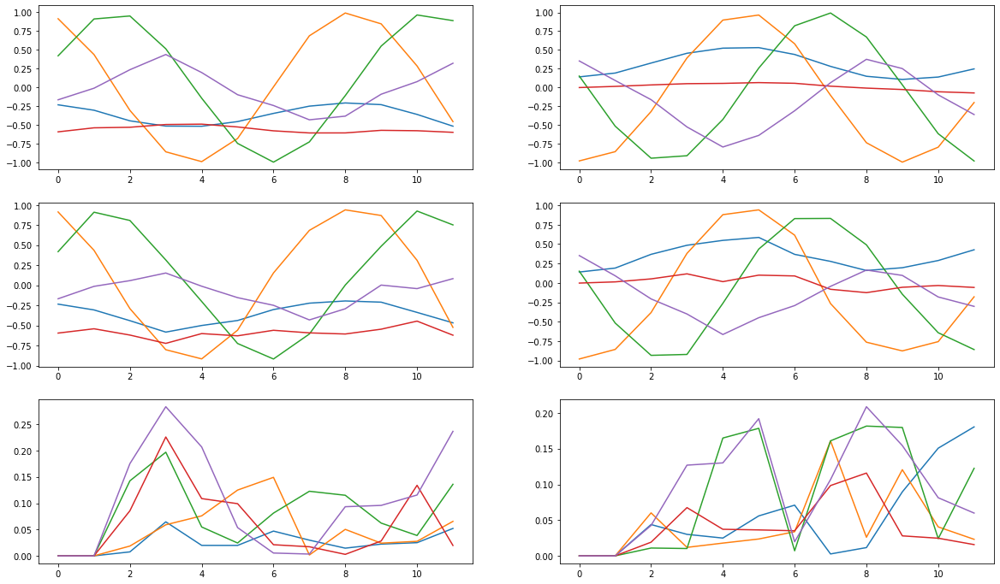

epoch: 	 0
gen loss:  0.24101731 d loss:  0.07419454 w_loss:  0.04235605
epoch: 	 1
gen loss:  0.25242117 d loss:  0.030676361 w_loss:  0.06434289
epoch: 	 2
gen loss:  0.2910425 d loss:  0.08104238 w_loss:  0.019899707
epoch: 	 3
gen loss:  0.25271198 d loss:  0.051395606 w_loss:  0.057163112
epoch: 	 4
gen loss:  0.29142246 d loss:  0.02925672 w_loss:  0.061875217
epoch: 	 5
gen loss:  0.29000962 d loss:  0.08732228 w_loss:  0.01830046
epoch: 	 6
gen loss:  0.280993 d loss:  0.014955309 w_loss:  0.078223385
epoch: 	 7
gen loss:  0.26003468 d loss:  0.065589 w_loss:  0.031602506
epoch: 	 8
gen loss:  0.3114501 d loss:  0.052301288 w_loss:  0.059561647
epoch: 	 9
gen loss:  0.27306077 d loss:  0.08400234 w_loss:  0.024819706
epoch: 	 10
gen loss:  0.20746899 d loss:  -0.01161852 w_loss:  0.13501742
epoch: 	 11
gen loss:  0.3184416 d loss:  0.071221344 w_loss:  0.04055833
epoch: 	 12
gen loss:  0.28981698 d loss:  0.12849781 w_loss:  -0.030323764
epoch: 	 13
gen loss:  0.28307104 d loss

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

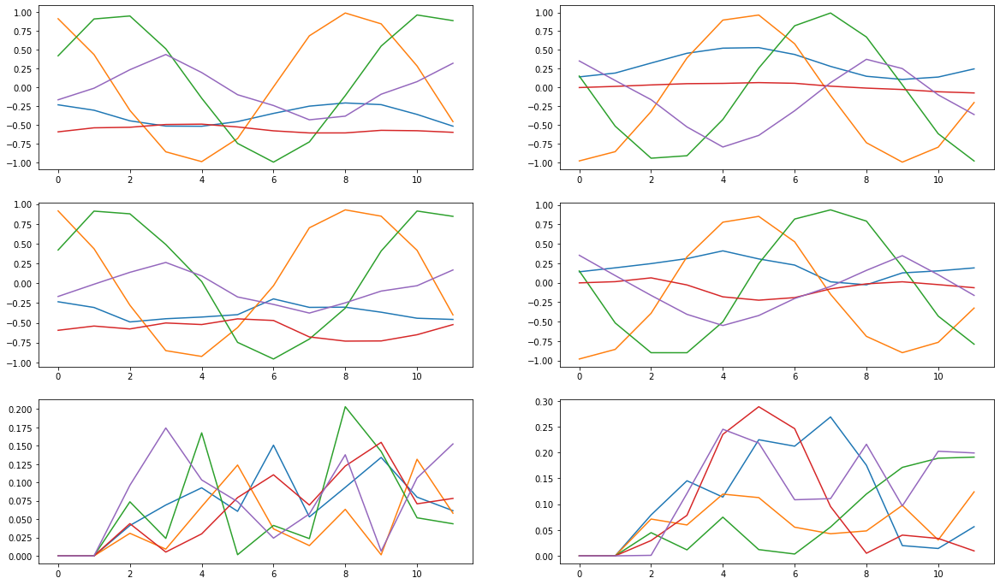

epoch: 	 0
gen loss:  0.38515955 d loss:  0.025178427 w_loss:  0.0711232
epoch: 	 1
gen loss:  0.38616228 d loss:  0.013918655 w_loss:  0.08307928
epoch: 	 2
gen loss:  0.3634716 d loss:  0.06355275 w_loss:  0.038248148
epoch: 	 3
gen loss:  0.3471767 d loss:  0.056830484 w_loss:  0.03935516
epoch: 	 4
gen loss:  0.33714324 d loss:  0.07408128 w_loss:  0.022077566
epoch: 	 5
gen loss:  0.4121375 d loss:  0.017177466 w_loss:  0.06830948
epoch: 	 6
gen loss:  0.38758498 d loss:  0.10927756 w_loss:  -0.0045690215
epoch: 	 7
gen loss:  0.38652676 d loss:  0.05773865 w_loss:  0.050223153
epoch: 	 8
gen loss:  0.30836216 d loss:  0.025954287 w_loss:  0.07000885
epoch: 	 9
gen loss:  0.37913364 d loss:  0.06794874 w_loss:  0.032732017
epoch: 	 10
gen loss:  0.36095414 d loss:  0.018002234 w_loss:  0.08913733
epoch: 	 11
gen loss:  0.42653236 d loss:  0.11113127 w_loss:  -0.008565983
epoch: 	 12
gen loss:  0.39410833 d loss:  0.030547082 w_loss:  0.077416375
epoch: 	 13
gen loss:  0.37733662 d

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

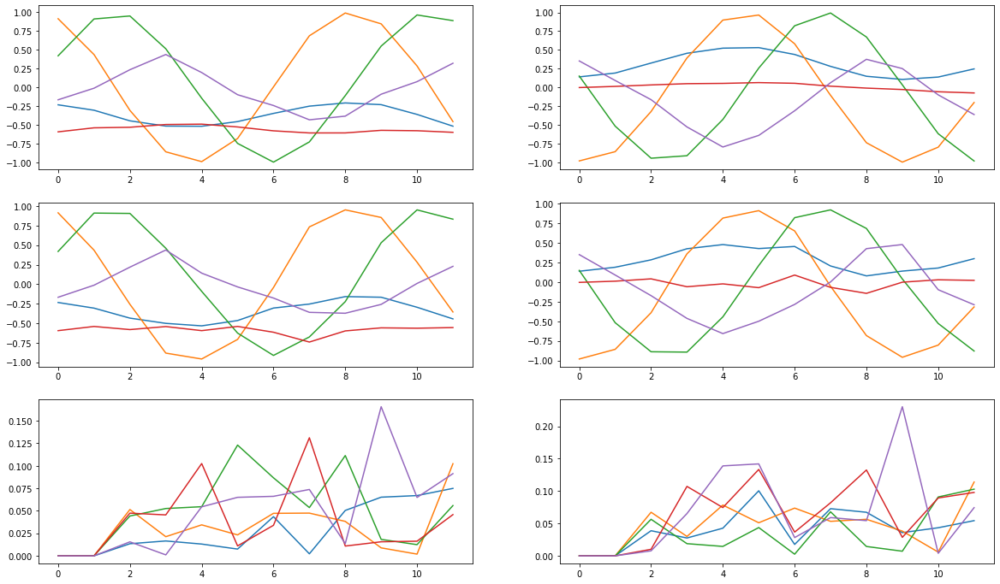

epoch: 	 0
gen loss:  0.53513986 d loss:  0.055252533 w_loss:  0.03878751
epoch: 	 1
gen loss:  0.53532255 d loss:  0.024522271 w_loss:  0.06707754
epoch: 	 2
gen loss:  0.45705986 d loss:  0.10536256 w_loss:  0.00021928288
epoch: 	 3
gen loss:  0.5159653 d loss:  0.032362174 w_loss:  0.056431048
epoch: 	 4
gen loss:  0.5392425 d loss:  0.08344607 w_loss:  0.0076662423
epoch: 	 5
gen loss:  0.5511088 d loss:  0.09670858 w_loss:  0.005534021
epoch: 	 6
gen loss:  0.5481167 d loss:  0.078728385 w_loss:  0.028596207
epoch: 	 7
gen loss:  0.5130207 d loss:  0.048480716 w_loss:  0.043720577
epoch: 	 8
gen loss:  0.5030687 d loss:  0.10775839 w_loss:  -0.0095149875
epoch: 	 9
gen loss:  0.559621 d loss:  0.06247724 w_loss:  0.032262713
epoch: 	 10
gen loss:  0.53146875 d loss:  0.04401967 w_loss:  0.04033874
epoch: 	 11
gen loss:  0.5395208 d loss:  0.07768595 w_loss:  0.033029616
epoch: 	 12
gen loss:  0.46187752 d loss:  0.08134948 w_loss:  0.015813414
epoch: 	 13
gen loss:  0.4750448 d lo

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
O

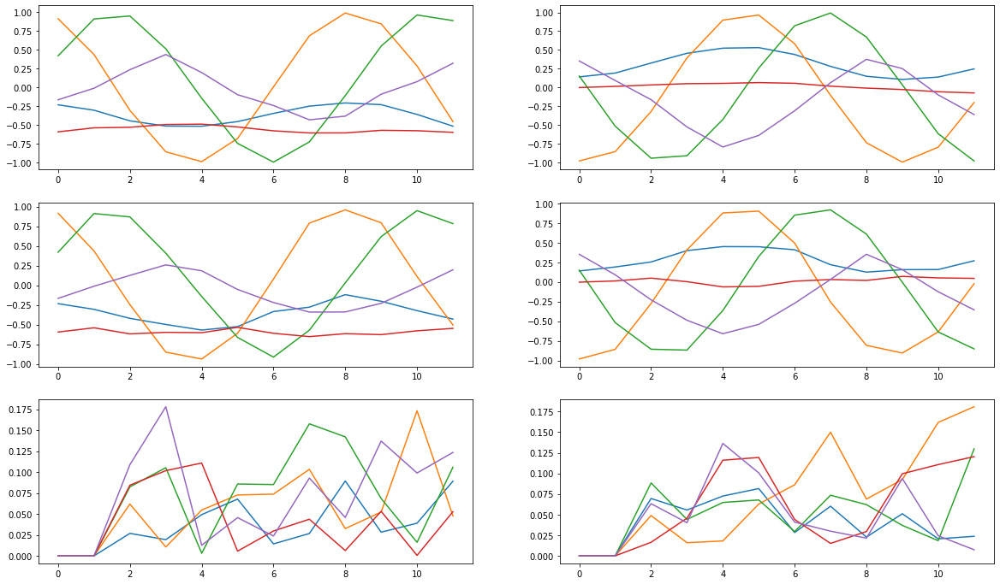

epoch: 	 0
gen loss:  0.48042387 d loss:  0.041756205 w_loss:  0.059335697
epoch: 	 1
gen loss:  0.5165752 d loss:  0.07031956 w_loss:  0.030286927
epoch: 	 2
gen loss:  0.5506244 d loss:  0.009348457 w_loss:  0.08305113
epoch: 	 3
gen loss:  0.54599273 d loss:  0.05463264 w_loss:  0.02921832
epoch: 	 4
gen loss:  0.5018313 d loss:  0.100049056 w_loss:  0.0074797124
epoch: 	 5
gen loss:  0.5261942 d loss:  0.1305141 w_loss:  -0.032433838
epoch: 	 6
gen loss:  0.45696145 d loss:  0.07539542 w_loss:  0.022636913
epoch: 	 7
gen loss:  0.5019812 d loss:  0.053055476 w_loss:  0.061295845
epoch: 	 8
gen loss:  0.5220326 d loss:  0.0396927 w_loss:  0.064184256
epoch: 	 9
gen loss:  0.5646592 d loss:  0.052786082 w_loss:  0.047740363
epoch: 	 10
gen loss:  0.5023585 d loss:  0.07098319 w_loss:  0.035902496
epoch: 	 11
gen loss:  0.5320403 d loss:  0.047778256 w_loss:  0.048527777
epoch: 	 12
gen loss:  0.51618654 d loss:  0.07947223 w_loss:  0.01375256
epoch: 	 13
gen loss:  0.5718192 d loss: 

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

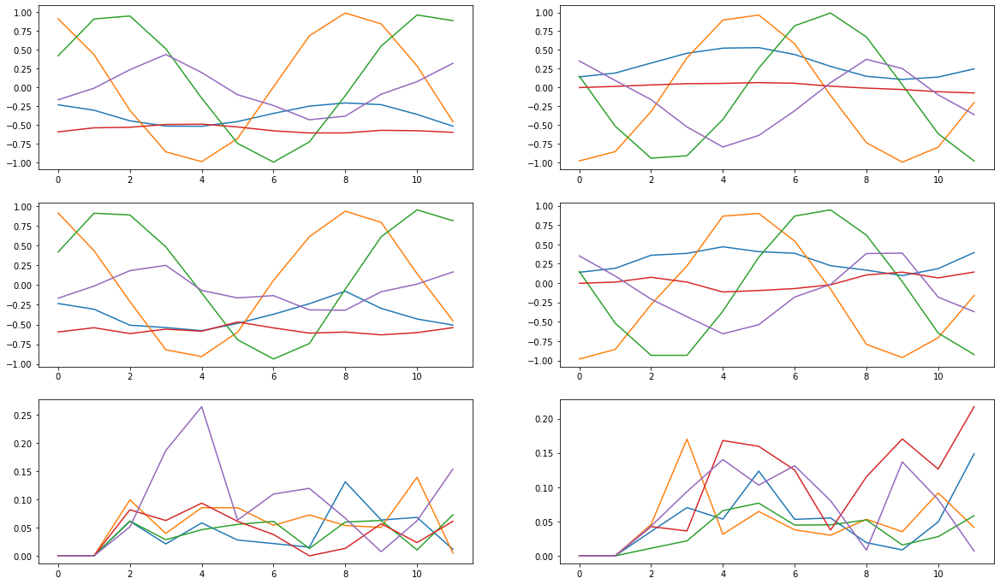

epoch: 	 0
gen loss:  0.70541656 d loss:  0.038463723 w_loss:  0.055228252
epoch: 	 1
gen loss:  0.6486346 d loss:  0.08369003 w_loss:  0.018608175
epoch: 	 2
gen loss:  0.607432 d loss:  0.018178381 w_loss:  0.0644242
epoch: 	 3
gen loss:  0.6479902 d loss:  0.024572281 w_loss:  0.06628393
epoch: 	 4
gen loss:  0.67275816 d loss:  0.016939733 w_loss:  0.07475045
epoch: 	 5
gen loss:  0.64446986 d loss:  0.058095284 w_loss:  0.040657256
epoch: 	 6
gen loss:  0.5642621 d loss:  0.033964746 w_loss:  0.04110412
epoch: 	 7
gen loss:  0.57182467 d loss:  0.05623565 w_loss:  0.036339015
epoch: 	 8
gen loss:  0.6129581 d loss:  0.034815405 w_loss:  0.04225386
epoch: 	 9
gen loss:  0.63456595 d loss:  0.01284012 w_loss:  0.08384283
epoch: 	 10
gen loss:  0.65569293 d loss:  0.13570422 w_loss:  -0.040779512
epoch: 	 11
gen loss:  0.6838366 d loss:  0.067614384 w_loss:  0.024715092
epoch: 	 12
gen loss:  0.6765686 d loss:  0.11987357 w_loss:  -0.017405588
epoch: 	 13
gen loss:  0.6440198 d loss:

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
O

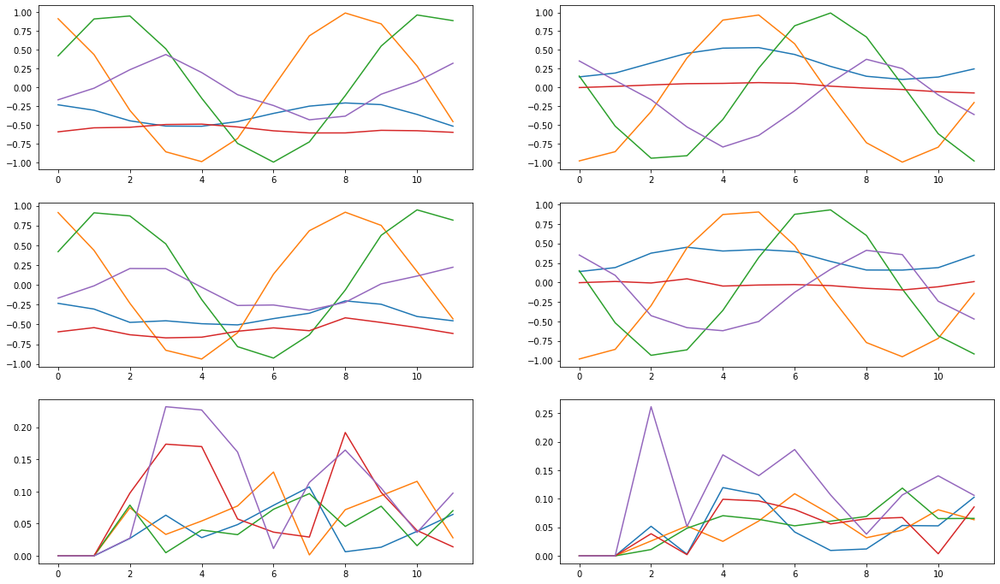

epoch: 	 0
gen loss:  0.6531026 d loss:  0.08816612 w_loss:  0.0068056895
epoch: 	 1
gen loss:  0.66240954 d loss:  0.05186377 w_loss:  0.030358111
epoch: 	 2
gen loss:  0.6373993 d loss:  0.08643085 w_loss:  0.013196227
epoch: 	 3
gen loss:  0.63092506 d loss:  0.08270265 w_loss:  0.011693059
epoch: 	 4
gen loss:  0.63797176 d loss:  0.022103626 w_loss:  0.057757158
epoch: 	 5
gen loss:  0.5608858 d loss:  0.028349206 w_loss:  0.07129077
epoch: 	 6
gen loss:  0.58852375 d loss:  0.06337434 w_loss:  0.039060034
epoch: 	 7
gen loss:  0.5694769 d loss:  0.04433092 w_loss:  0.03494569
epoch: 	 8
gen loss:  0.5733662 d loss:  0.058868818 w_loss:  0.049904447
epoch: 	 9
gen loss:  0.57249105 d loss:  0.1011336 w_loss:  -0.0001561001
epoch: 	 10
gen loss:  0.60105944 d loss:  0.045127638 w_loss:  0.054299913
epoch: 	 11
gen loss:  0.56416005 d loss:  0.03656127 w_loss:  0.059832722
epoch: 	 12
gen loss:  0.59594 d loss:  0.054145098 w_loss:  0.040485002
epoch: 	 13
gen loss:  0.561567 d loss

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

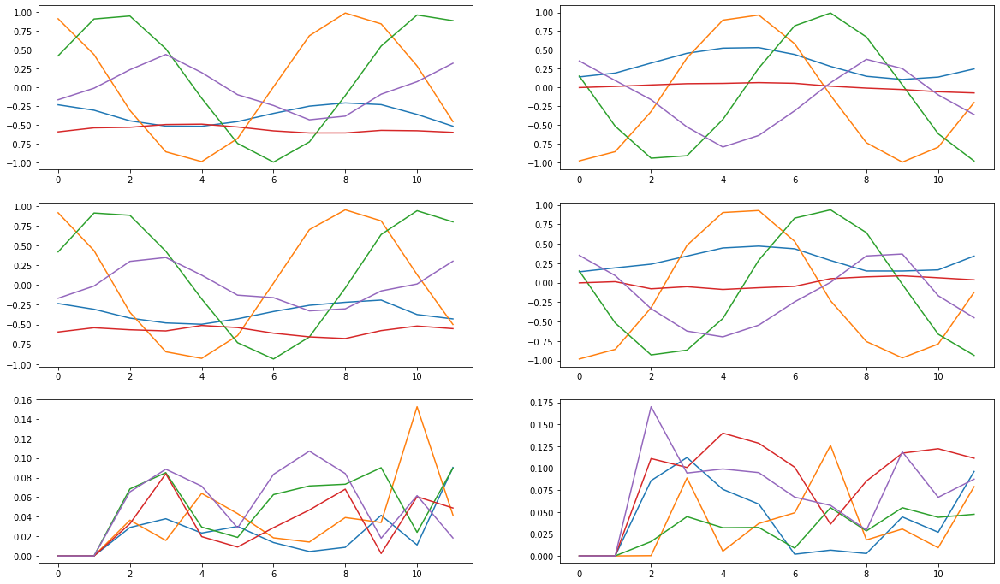

epoch: 	 0
gen loss:  0.5970751 d loss:  0.07534628 w_loss:  0.012732431
epoch: 	 1
gen loss:  0.5834197 d loss:  0.11220799 w_loss:  -0.009136157
epoch: 	 2
gen loss:  0.65589607 d loss:  0.052430503 w_loss:  0.042286515
epoch: 	 3
gen loss:  0.6516684 d loss:  0.08863215 w_loss:  -0.0046481364
epoch: 	 4
gen loss:  0.62990427 d loss:  0.05187872 w_loss:  0.037141826
epoch: 	 5
gen loss:  0.63950527 d loss:  0.09289121 w_loss:  0.012756845
epoch: 	 6
gen loss:  0.6410373 d loss:  0.058564294 w_loss:  0.023743954
epoch: 	 7
gen loss:  0.6524571 d loss:  0.091696516 w_loss:  0.0021696936
epoch: 	 8
gen loss:  0.6264034 d loss:  0.05812473 w_loss:  0.029125273
epoch: 	 9
gen loss:  0.6591619 d loss:  0.104414344 w_loss:  0.0038819015
epoch: 	 10
gen loss:  0.6167509 d loss:  0.05356118 w_loss:  0.028997269
epoch: 	 11
gen loss:  0.6044105 d loss:  0.068339646 w_loss:  0.023141315
epoch: 	 12
gen loss:  0.6396947 d loss:  0.05804951 w_loss:  0.029890457
epoch: 	 13
gen loss:  0.6409439 d 

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

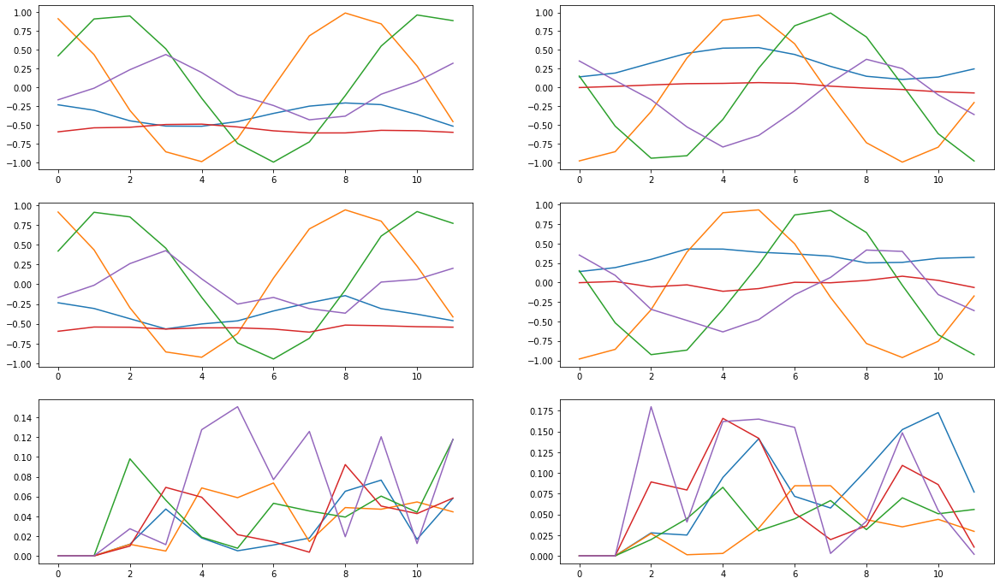

epoch: 	 0
gen loss:  0.6233044 d loss:  0.09156553 w_loss:  -0.00016548038
epoch: 	 1
gen loss:  0.6294017 d loss:  0.064633794 w_loss:  0.047247924
epoch: 	 2
gen loss:  0.59523535 d loss:  0.010967078 w_loss:  0.079941355
epoch: 	 3
gen loss:  0.605318 d loss:  0.02760383 w_loss:  0.055248667
epoch: 	 4
gen loss:  0.6045734 d loss:  0.0978503 w_loss:  -0.01322149
epoch: 	 5
gen loss:  0.6489383 d loss:  0.063927315 w_loss:  0.021343071
epoch: 	 6
gen loss:  0.58861893 d loss:  0.016327562 w_loss:  0.07121537
epoch: 	 7
gen loss:  0.5912491 d loss:  0.057767283 w_loss:  0.021627402
epoch: 	 8
gen loss:  0.57942367 d loss:  0.08312325 w_loss:  0.023385031
epoch: 	 9
gen loss:  0.62331355 d loss:  0.060161836 w_loss:  0.043704912
epoch: 	 10
gen loss:  0.6263684 d loss:  0.023650238 w_loss:  0.08037206
epoch: 	 11
gen loss:  0.60778654 d loss:  0.09364942 w_loss:  0.016437542
epoch: 	 12
gen loss:  0.5841086 d loss:  0.006152495 w_loss:  0.077517174
epoch: 	 13
gen loss:  0.57841235 d 

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
O

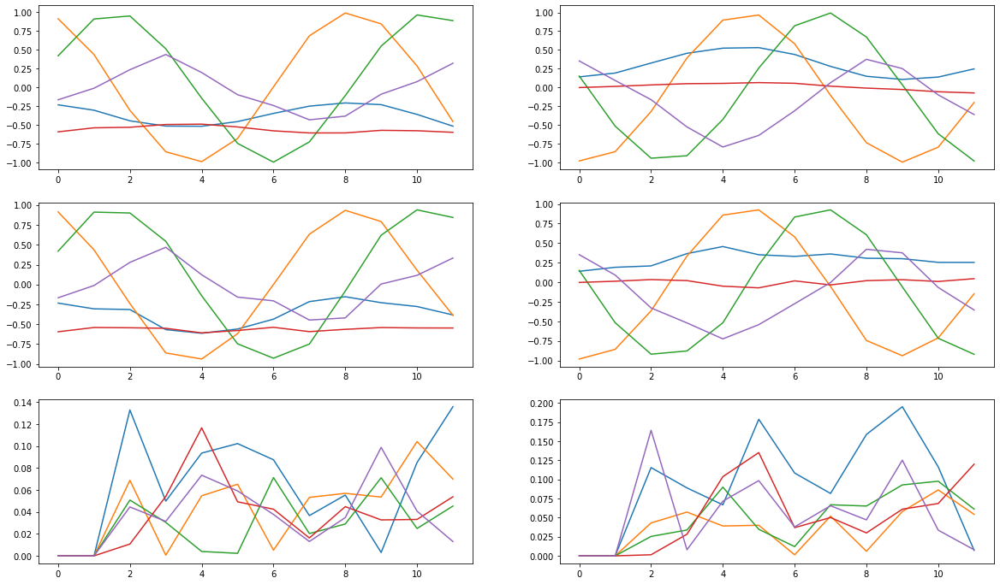

epoch: 	 0
gen loss:  0.6447204 d loss:  0.07461311 w_loss:  0.0280137
epoch: 	 1
gen loss:  0.66590726 d loss:  0.092866905 w_loss:  0.0017347671
epoch: 	 2
gen loss:  0.6738961 d loss:  0.042851105 w_loss:  0.05284658
epoch: 	 3
gen loss:  0.6678328 d loss:  0.08929303 w_loss:  0.0031809644
epoch: 	 4
gen loss:  0.7044877 d loss:  0.060346257 w_loss:  0.038211215
epoch: 	 5
gen loss:  0.68658245 d loss:  0.048322313 w_loss:  0.051282585
epoch: 	 6
gen loss:  0.6680306 d loss:  0.118658125 w_loss:  -0.024723718
epoch: 	 7
gen loss:  0.7181106 d loss:  0.12621588 w_loss:  -0.024933618
epoch: 	 8
gen loss:  0.71018195 d loss:  0.028945053 w_loss:  0.06729788
epoch: 	 9
gen loss:  0.6889246 d loss:  0.022427512 w_loss:  0.07156705
epoch: 	 10
gen loss:  0.73046005 d loss:  0.05474491 w_loss:  0.04160803
epoch: 	 11
gen loss:  0.69919884 d loss:  0.024736214 w_loss:  0.06318291
epoch: 	 12
gen loss:  0.7459856 d loss:  0.10127614 w_loss:  -0.00560043
epoch: 	 13
gen loss:  0.76694465 d lo

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
O

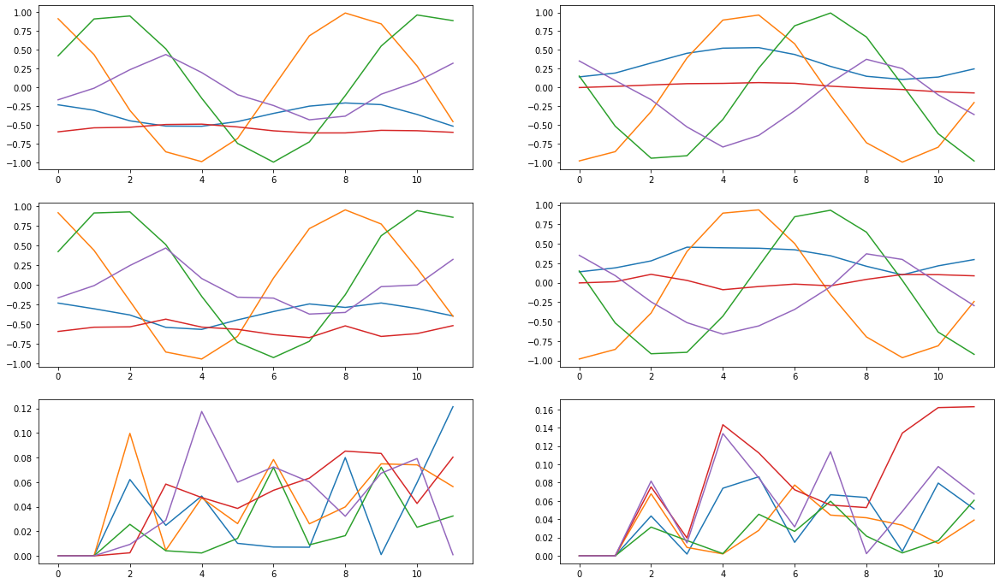

epoch: 	 0
gen loss:  0.7478837 d loss:  0.09109826 w_loss:  0.005254897
epoch: 	 1
gen loss:  0.7844659 d loss:  0.06519855 w_loss:  0.031857826
epoch: 	 2
gen loss:  0.802753 d loss:  0.0823039 w_loss:  0.015474814
epoch: 	 3
gen loss:  0.75390387 d loss:  0.093203686 w_loss:  -2.0124764e-05
epoch: 	 4
gen loss:  0.7360595 d loss:  0.10832629 w_loss:  0.010640102
epoch: 	 5
gen loss:  0.75030535 d loss:  0.046506662 w_loss:  0.04147505
epoch: 	 6
gen loss:  0.71160614 d loss:  0.11503623 w_loss:  -0.025371019
epoch: 	 7
gen loss:  0.7669561 d loss:  0.09589685 w_loss:  -0.002521736
epoch: 	 8
gen loss:  0.77196985 d loss:  0.057390742 w_loss:  0.034246933
epoch: 	 9
gen loss:  0.7646738 d loss:  0.10250936 w_loss:  -0.015825639
epoch: 	 10
gen loss:  0.7881572 d loss:  0.04647497 w_loss:  0.054946788
epoch: 	 11
gen loss:  0.7568065 d loss:  0.043445453 w_loss:  0.037434626
epoch: 	 12
gen loss:  0.7538139 d loss:  0.06743959 w_loss:  0.02906074
epoch: 	 13
gen loss:  0.76953465 d lo

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
O

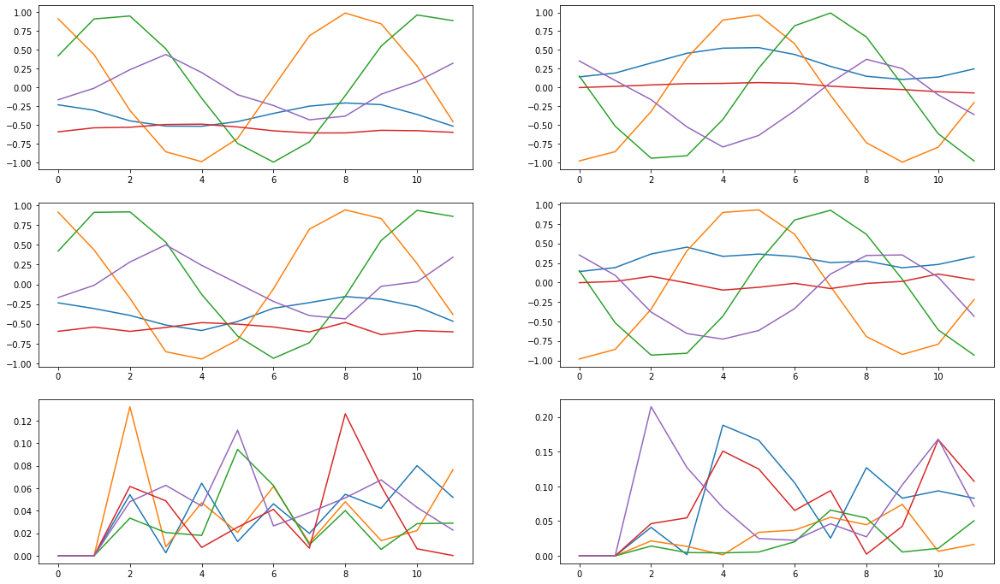

epoch: 	 0
gen loss:  0.8336051 d loss:  0.0824465 w_loss:  0.013302025
epoch: 	 1
gen loss:  0.8798973 d loss:  0.047594428 w_loss:  0.051159017
epoch: 	 2
gen loss:  0.81165534 d loss:  0.030431086 w_loss:  0.061219312
epoch: 	 3
gen loss:  0.8517846 d loss:  0.059221387 w_loss:  0.03875608
epoch: 	 4
gen loss:  0.870372 d loss:  0.045026056 w_loss:  0.038917962
epoch: 	 5
gen loss:  0.8527218 d loss:  0.048781775 w_loss:  0.05724845
epoch: 	 6
gen loss:  0.83648205 d loss:  0.06724661 w_loss:  0.038746327
epoch: 	 7
gen loss:  0.828796 d loss:  0.07219116 w_loss:  0.018701535
epoch: 	 8
gen loss:  0.8354586 d loss:  0.05299325 w_loss:  0.04264002
epoch: 	 9
gen loss:  0.7721838 d loss:  0.06639122 w_loss:  0.039049305
epoch: 	 10
gen loss:  0.74745685 d loss:  0.024607146 w_loss:  0.069939785
epoch: 	 11
gen loss:  0.7600087 d loss:  0.06479051 w_loss:  0.034233257
epoch: 	 12
gen loss:  0.7557685 d loss:  0.06895057 w_loss:  0.015847228
epoch: 	 13
gen loss:  0.77499497 d loss:  0.

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
O

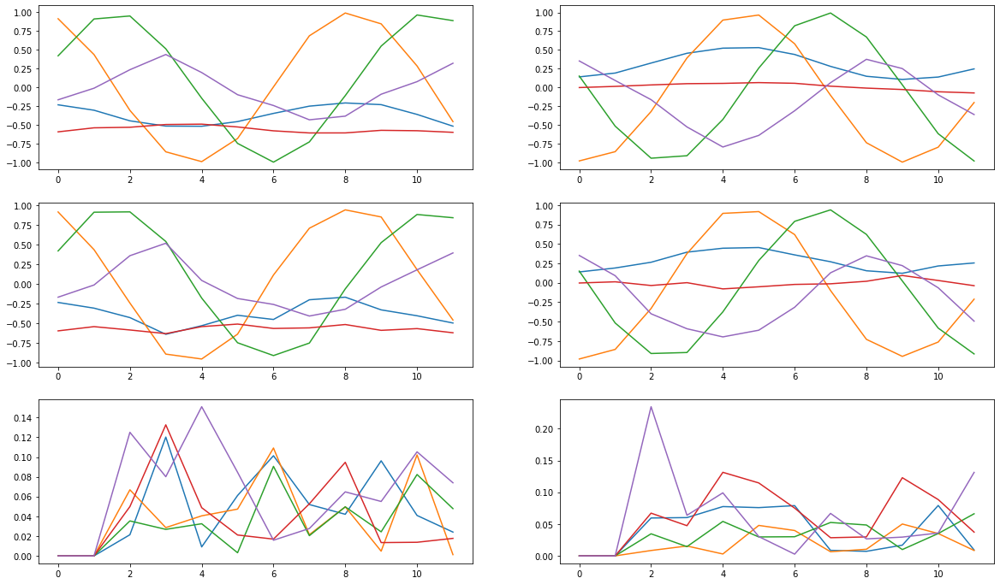

epoch: 	 0
gen loss:  0.6811615 d loss:  0.057959665 w_loss:  0.042183705
epoch: 	 1
gen loss:  0.76767343 d loss:  0.09107625 w_loss:  0.00885344
epoch: 	 2
gen loss:  0.70696914 d loss:  0.07297571 w_loss:  0.021393616
epoch: 	 3
gen loss:  0.7218602 d loss:  0.07386236 w_loss:  0.0236828
epoch: 	 4
gen loss:  0.7666789 d loss:  0.06695276 w_loss:  0.032267816
epoch: 	 5
gen loss:  0.75323874 d loss:  0.035381667 w_loss:  0.06008652
epoch: 	 6
gen loss:  0.7443192 d loss:  0.07085957 w_loss:  0.04071297
epoch: 	 7
gen loss:  0.7345742 d loss:  0.04100093 w_loss:  0.051373374
epoch: 	 8
gen loss:  0.73904693 d loss:  0.110065185 w_loss:  -0.012183538
epoch: 	 9
gen loss:  0.75209963 d loss:  0.060775615 w_loss:  0.01646689
epoch: 	 10
gen loss:  0.7670883 d loss:  0.043239675 w_loss:  0.038395204
epoch: 	 11
gen loss:  0.76615727 d loss:  0.054317124 w_loss:  0.038223445
epoch: 	 12
gen loss:  0.73870504 d loss:  0.037055686 w_loss:  0.04483051
epoch: 	 13
gen loss:  0.7318374 d loss:

Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Do

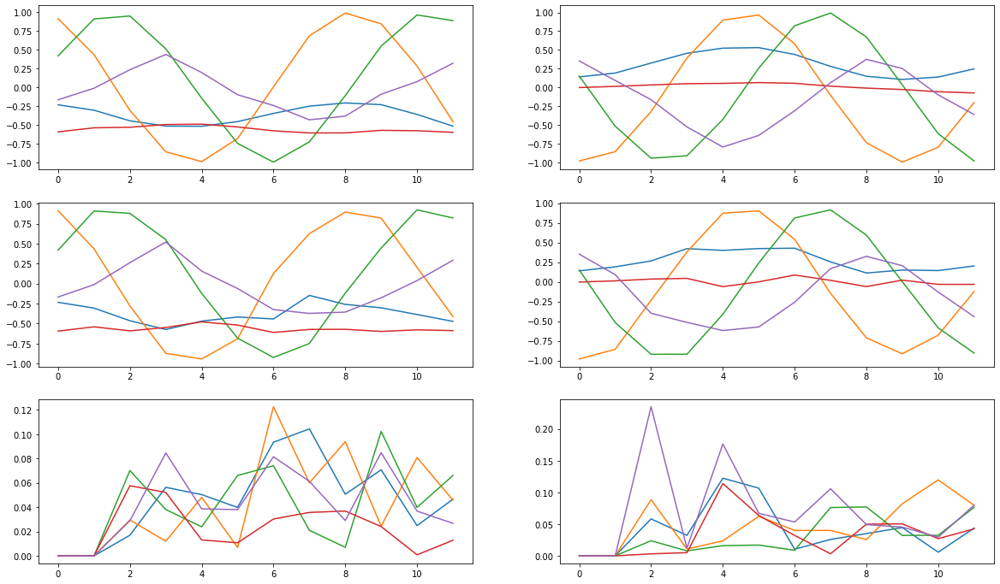

epoch: 	 0
gen loss:  0.7809452 d loss:  0.02280112 w_loss:  0.06056582
epoch: 	 1
gen loss:  0.7651951 d loss:  0.06049158 w_loss:  0.024314245
epoch: 	 2
gen loss:  0.7557358 d loss:  0.10012084 w_loss:  -0.025992405
epoch: 	 3
gen loss:  0.7939042 d loss:  0.07776544 w_loss:  0.012867486
epoch: 	 4
gen loss:  0.7886093 d loss:  0.051320333 w_loss:  0.02669539
epoch: 	 5
gen loss:  0.75307363 d loss:  0.0550479 w_loss:  0.042567503
epoch: 	 6
gen loss:  0.74249655 d loss:  0.078962184 w_loss:  0.009212123
epoch: 	 7
gen loss:  0.72096187 d loss:  0.014203658 w_loss:  0.093942806
epoch: 	 8
gen loss:  0.7452829 d loss:  0.07717519 w_loss:  -0.0016455598
epoch: 	 9
gen loss:  0.7386409 d loss:  0.047002114 w_loss:  0.027573586
epoch: 	 10
gen loss:  0.74266016 d loss:  0.033656042 w_loss:  0.060672034
epoch: 	 11
gen loss:  0.82043993 d loss:  0.05299353 w_loss:  0.04807168
epoch: 	 12
gen loss:  0.8116636 d loss:  0.05122756 w_loss:  0.03417413
epoch: 	 13
gen loss:  0.7992948 d loss:

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
O

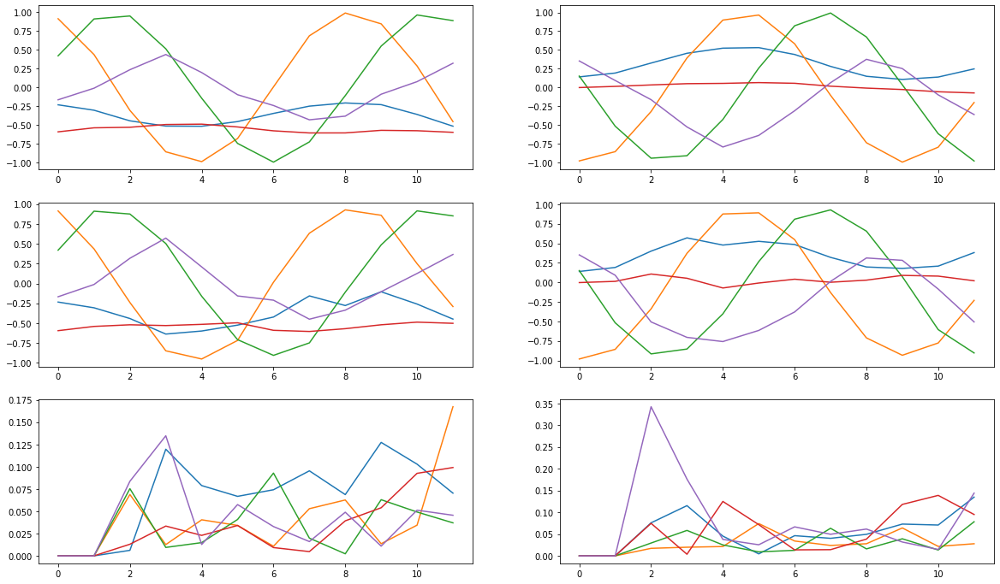

epoch: 	 0
gen loss:  0.73622173 d loss:  0.010472932 w_loss:  0.082312815
epoch: 	 1
gen loss:  0.7572035 d loss:  0.0479014 w_loss:  0.03707803
epoch: 	 2
gen loss:  0.8014132 d loss:  0.1376755 w_loss:  -0.040694825
epoch: 	 3
gen loss:  0.7347555 d loss:  0.06885696 w_loss:  0.017849028
epoch: 	 4
gen loss:  0.7160259 d loss:  0.072249964 w_loss:  0.021423485
epoch: 	 5
gen loss:  0.723591 d loss:  0.040513713 w_loss:  0.06848188
epoch: 	 6
gen loss:  0.74533004 d loss:  0.044906504 w_loss:  0.05240517
epoch: 	 7
gen loss:  0.7371722 d loss:  0.05202011 w_loss:  0.04562545
epoch: 	 8
gen loss:  0.7468689 d loss:  0.020284623 w_loss:  0.08008344
epoch: 	 9
gen loss:  0.7249404 d loss:  0.056875728 w_loss:  0.04457517
epoch: 	 10
gen loss:  0.7510048 d loss:  0.048977774 w_loss:  0.049986474
epoch: 	 11
gen loss:  0.75151634 d loss:  0.10996191 w_loss:  -0.02330499
epoch: 	 12
gen loss:  0.7180996 d loss:  0.07417484 w_loss:  0.021341406
epoch: 	 13
gen loss:  0.738477 d loss:  0.086

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

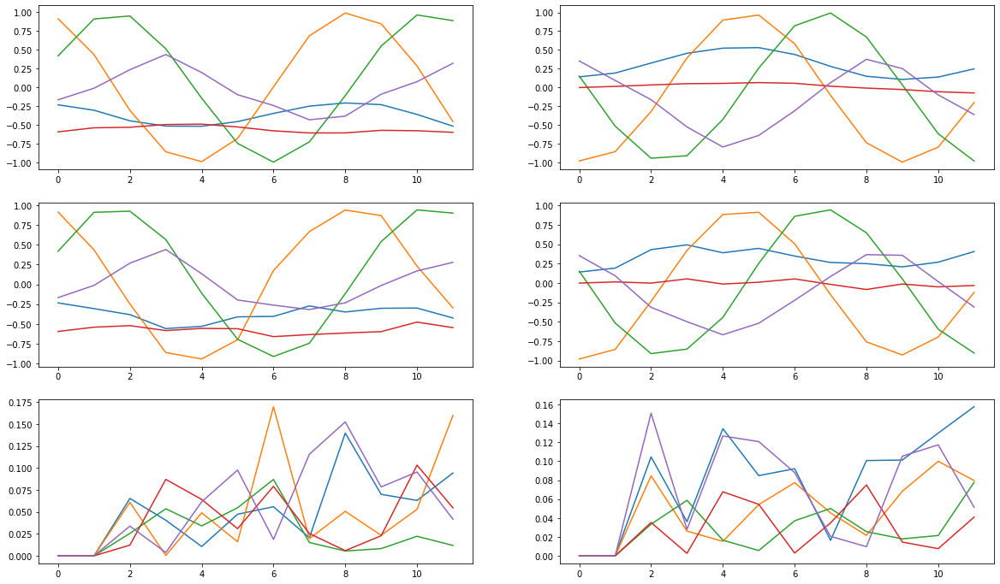

epoch: 	 0
gen loss:  0.7961456 d loss:  0.0856906 w_loss:  -0.0026751733
epoch: 	 1
gen loss:  0.7912905 d loss:  0.08173709 w_loss:  0.01365793
epoch: 	 2
gen loss:  0.8064411 d loss:  0.08836358 w_loss:  0.0024094984
epoch: 	 3
gen loss:  0.7839637 d loss:  0.050311595 w_loss:  0.03114892
epoch: 	 4
gen loss:  0.76686865 d loss:  0.09612725 w_loss:  -0.0069369143
epoch: 	 5
gen loss:  0.7250127 d loss:  0.09237485 w_loss:  -0.0048735784
epoch: 	 6
gen loss:  0.7534064 d loss:  0.039795645 w_loss:  0.050884485
epoch: 	 7
gen loss:  0.77020067 d loss:  0.082675196 w_loss:  0.012490897
epoch: 	 8
gen loss:  0.7650419 d loss:  0.04005963 w_loss:  0.049580615
epoch: 	 9
gen loss:  0.7085627 d loss:  0.08112256 w_loss:  0.012520438
epoch: 	 10
gen loss:  0.73623383 d loss:  0.05267533 w_loss:  0.03442981
epoch: 	 11
gen loss:  0.7190886 d loss:  0.070561856 w_loss:  0.029932003
epoch: 	 12
gen loss:  0.75380003 d loss:  0.08676435 w_loss:  0.02013548
epoch: 	 13
gen loss:  0.7200812 d los

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
O

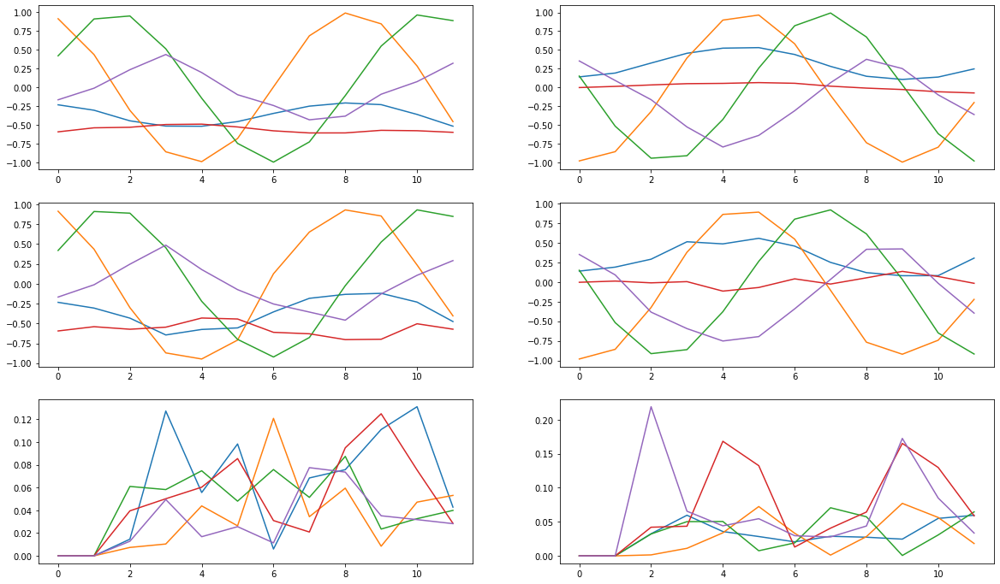

epoch: 	 0
gen loss:  0.69686246 d loss:  0.09361945 w_loss:  0.012948567
epoch: 	 1
gen loss:  0.73559433 d loss:  0.07775513 w_loss:  0.020200394
epoch: 	 2
gen loss:  0.73338354 d loss:  0.06912274 w_loss:  0.03839789
epoch: 	 3
gen loss:  0.702737 d loss:  0.044994034 w_loss:  0.03958467
epoch: 	 4
gen loss:  0.75568825 d loss:  0.052138835 w_loss:  0.037766747
epoch: 	 5
gen loss:  0.72885764 d loss:  0.08022652 w_loss:  0.022010984
epoch: 	 6
gen loss:  0.7258251 d loss:  0.05354601 w_loss:  0.050171066
epoch: 	 7
gen loss:  0.72496986 d loss:  0.045446754 w_loss:  0.052084677
epoch: 	 8
gen loss:  0.75142634 d loss:  0.067481324 w_loss:  0.0133639965
epoch: 	 9
gen loss:  0.6997146 d loss:  0.09498154 w_loss:  0.015585895
epoch: 	 10
gen loss:  0.76609397 d loss:  0.092267655 w_loss:  0.018560534
epoch: 	 11
gen loss:  0.80206597 d loss:  0.06755485 w_loss:  0.019924711
epoch: 	 12
gen loss:  0.7801433 d loss:  0.040911365 w_loss:  0.038908303
epoch: 	 13
gen loss:  0.7728283 d 

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
O

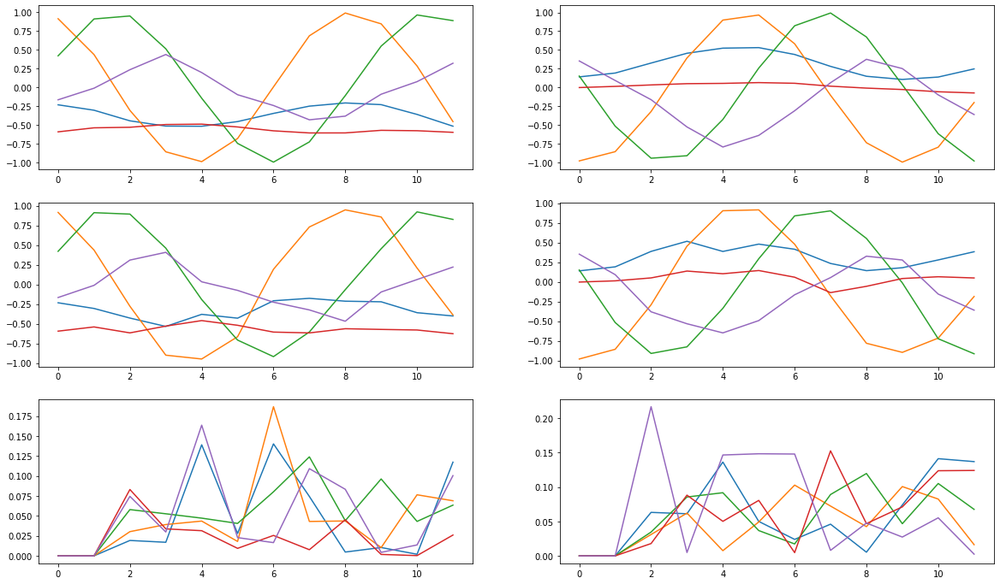

epoch: 	 0
gen loss:  0.84692633 d loss:  0.09124481 w_loss:  -0.0055733807
epoch: 	 1
gen loss:  0.81887484 d loss:  0.06991248 w_loss:  0.030049732
epoch: 	 2
gen loss:  0.85156745 d loss:  0.12371757 w_loss:  -0.03930963
epoch: 	 3
gen loss:  0.8895532 d loss:  0.047646068 w_loss:  0.03069986
epoch: 	 4
gen loss:  0.82816774 d loss:  0.09368166 w_loss:  0.0024658039
epoch: 	 5
gen loss:  0.8506548 d loss:  0.079090595 w_loss:  0.012533206
epoch: 	 6
gen loss:  0.85292244 d loss:  0.075002596 w_loss:  0.020080823
epoch: 	 7
gen loss:  0.8389961 d loss:  0.04791806 w_loss:  0.042312313
epoch: 	 8
gen loss:  0.8574168 d loss:  0.052524917 w_loss:  0.045358874
epoch: 	 9
gen loss:  0.84242696 d loss:  0.059055377 w_loss:  0.021724423
epoch: 	 10
gen loss:  0.8490961 d loss:  0.104828015 w_loss:  -0.013156021
epoch: 	 11
gen loss:  0.86172855 d loss:  0.06112211 w_loss:  0.021791179
epoch: 	 12
gen loss:  0.88467866 d loss:  0.07149769 w_loss:  0.0054169074
epoch: 	 13
gen loss:  0.86718

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

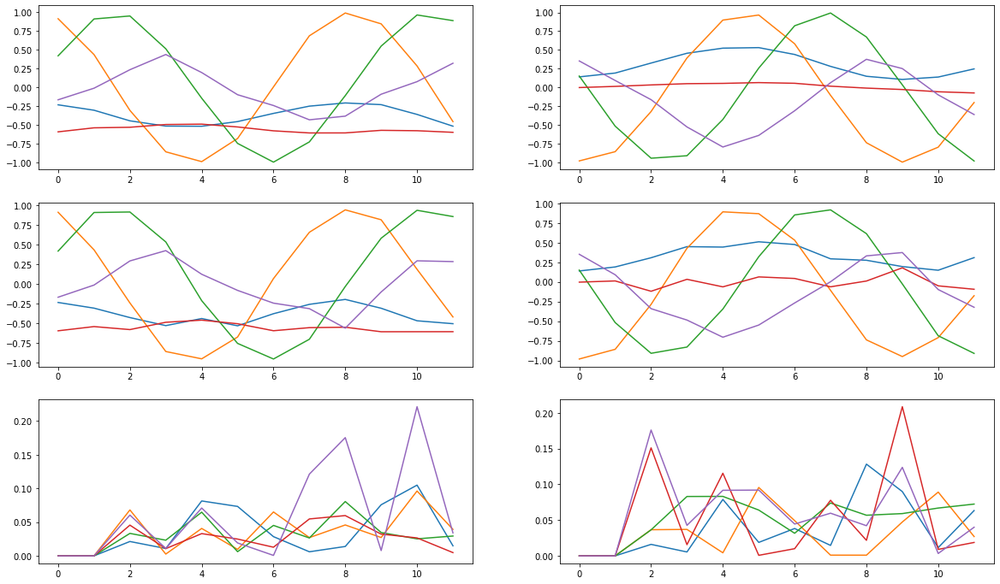

epoch: 	 0
gen loss:  0.9421002 d loss:  0.07368009 w_loss:  0.027866263
epoch: 	 1
gen loss:  0.9618861 d loss:  0.019352084 w_loss:  0.066736385
epoch: 	 2
gen loss:  0.9137157 d loss:  0.011497283 w_loss:  0.0754867
epoch: 	 3
gen loss:  0.9303859 d loss:  0.059982996 w_loss:  0.025886482
epoch: 	 4
gen loss:  0.96516484 d loss:  0.03210149 w_loss:  0.045346398
epoch: 	 5
gen loss:  0.93962526 d loss:  0.11103573 w_loss:  -0.028972935
epoch: 	 6
gen loss:  0.9468988 d loss:  0.08136925 w_loss:  0.005913335
epoch: 	 7
gen loss:  0.92929393 d loss:  0.11297135 w_loss:  -0.010800066
epoch: 	 8
gen loss:  0.95469964 d loss:  0.08499943 w_loss:  -0.0005566545
epoch: 	 9
gen loss:  0.9375038 d loss:  0.06472533 w_loss:  0.027174246
epoch: 	 10
gen loss:  0.9230687 d loss:  0.051665504 w_loss:  0.03632313
epoch: 	 11
gen loss:  0.9655937 d loss:  0.025694888 w_loss:  0.06338887
epoch: 	 12
gen loss:  0.9482446 d loss:  0.08298324 w_loss:  0.0037214532
epoch: 	 13
gen loss:  0.94449395 d lo

Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Do

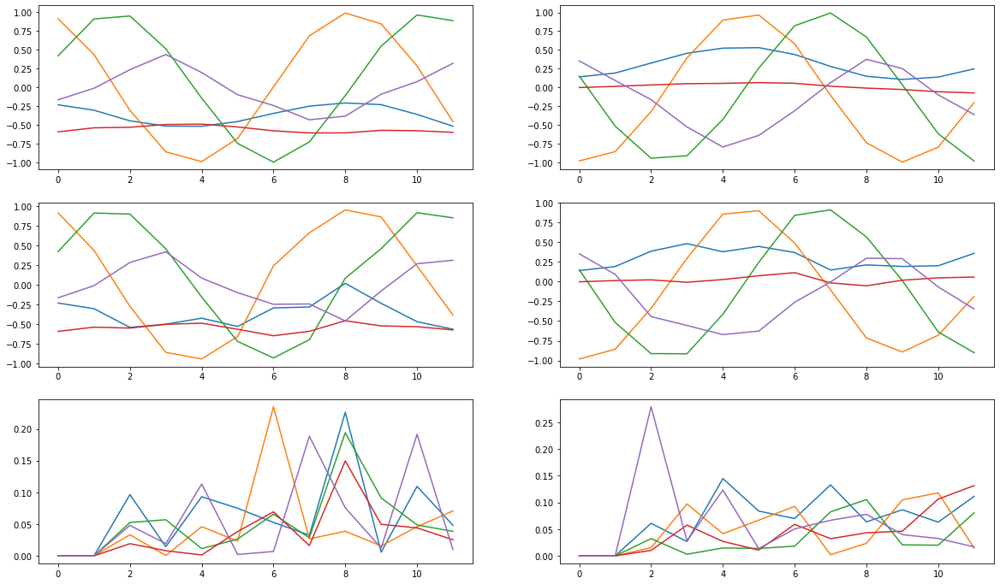

epoch: 	 0
gen loss:  0.92381 d loss:  0.13180073 w_loss:  -0.044226874
epoch: 	 1
gen loss:  1.0040867 d loss:  0.08332764 w_loss:  0.0159115
epoch: 	 2
gen loss:  0.96169317 d loss:  0.05860002 w_loss:  0.028784215
epoch: 	 3
gen loss:  0.95632267 d loss:  0.080436245 w_loss:  0.00967558
epoch: 	 4
gen loss:  0.93307906 d loss:  0.026620824 w_loss:  0.06019334
epoch: 	 5
gen loss:  0.97815096 d loss:  0.09806254 w_loss:  -0.011198992
epoch: 	 6
gen loss:  0.96353495 d loss:  0.089938015 w_loss:  0.007807214
epoch: 	 7
gen loss:  0.935696 d loss:  0.0810206 w_loss:  0.011341355
epoch: 	 8
gen loss:  0.99033576 d loss:  0.049392484 w_loss:  0.040130164
epoch: 	 9
gen loss:  0.9466003 d loss:  0.06461569 w_loss:  0.02129474
epoch: 	 10
gen loss:  0.96128166 d loss:  0.05375757 w_loss:  0.026704494
epoch: 	 11
gen loss:  0.96727306 d loss:  0.07894642 w_loss:  0.0128772985
epoch: 	 12
gen loss:  0.9079623 d loss:  0.020712193 w_loss:  0.07228363
epoch: 	 13
gen loss:  0.90167636 d loss: 

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
O

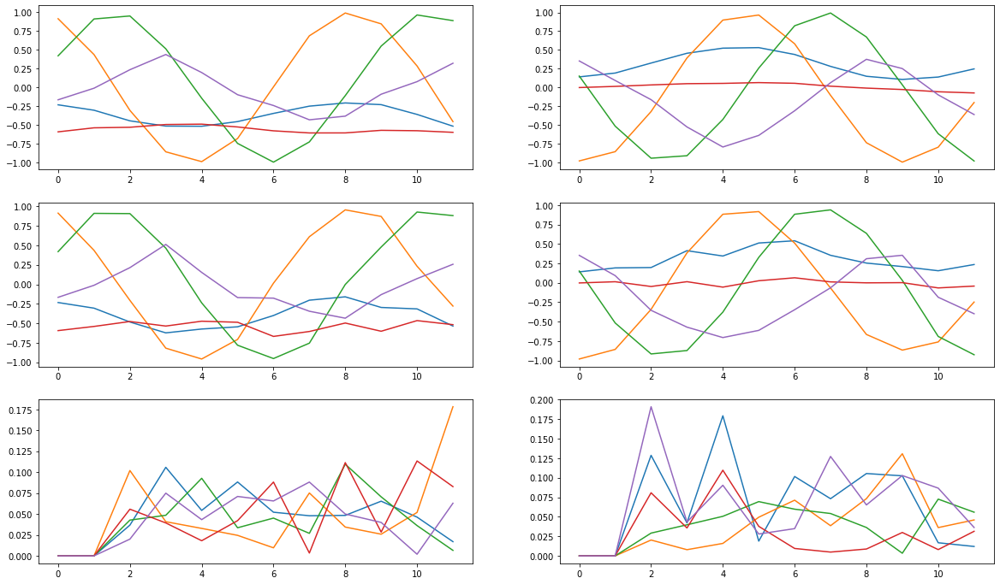

epoch: 	 0
gen loss:  0.91696054 d loss:  0.04806111 w_loss:  0.038247153
epoch: 	 1
gen loss:  0.941685 d loss:  0.04882459 w_loss:  0.041387666
epoch: 	 2
gen loss:  0.9457997 d loss:  0.08831315 w_loss:  0.020804
epoch: 	 3
gen loss:  0.95189935 d loss:  0.030654397 w_loss:  0.061600517
epoch: 	 4
gen loss:  0.8977251 d loss:  -0.01740327 w_loss:  0.100336
epoch: 	 5
gen loss:  0.9246599 d loss:  0.07496796 w_loss:  0.012728644
epoch: 	 6
gen loss:  0.9224993 d loss:  0.07256252 w_loss:  0.03430768
epoch: 	 7
gen loss:  0.9149146 d loss:  0.044952385 w_loss:  0.04147851
epoch: 	 8
gen loss:  0.9319905 d loss:  0.09108253 w_loss:  -0.0054386505
epoch: 	 9
gen loss:  0.9368418 d loss:  0.08289693 w_loss:  -0.003119298
epoch: 	 10
gen loss:  0.9466159 d loss:  0.03686072 w_loss:  0.056860548
epoch: 	 11
gen loss:  0.9333224 d loss:  0.08640467 w_loss:  0.0139700575
epoch: 	 12
gen loss:  0.95485306 d loss:  0.09245643 w_loss:  0.0042679445
epoch: 	 13
gen loss:  0.97867584 d loss:  0.0

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

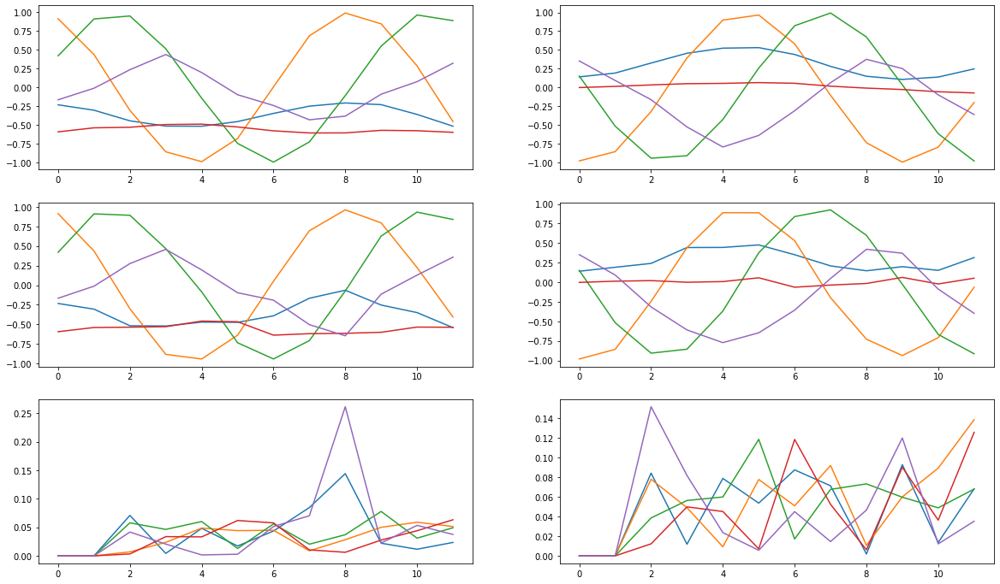

epoch: 	 0
gen loss:  1.0437417 d loss:  0.056026924 w_loss:  0.060403623
epoch: 	 1
gen loss:  1.0347431 d loss:  0.077948675 w_loss:  0.0017102942
epoch: 	 2
gen loss:  1.0660205 d loss:  0.070023894 w_loss:  0.01656578
epoch: 	 3
gen loss:  1.0307558 d loss:  0.043712635 w_loss:  0.035459273
epoch: 	 4
gen loss:  1.019398 d loss:  0.06047973 w_loss:  0.047557782
epoch: 	 5
gen loss:  1.0413873 d loss:  0.045434877 w_loss:  0.034142297
epoch: 	 6
gen loss:  1.0070717 d loss:  0.07849542 w_loss:  0.008364387
epoch: 	 7
gen loss:  1.014985 d loss:  0.052041084 w_loss:  0.045556165
epoch: 	 8
gen loss:  1.0041533 d loss:  0.06404149 w_loss:  0.023811368
epoch: 	 9
gen loss:  0.9863159 d loss:  0.034141246 w_loss:  0.06080835
epoch: 	 10
gen loss:  1.0013367 d loss:  0.033992372 w_loss:  0.05382669
epoch: 	 11
gen loss:  1.0048707 d loss:  0.07223116 w_loss:  0.024031866
epoch: 	 12
gen loss:  1.0212147 d loss:  0.028617207 w_loss:  0.053240485
epoch: 	 13
gen loss:  1.0157388 d loss:  0

Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 

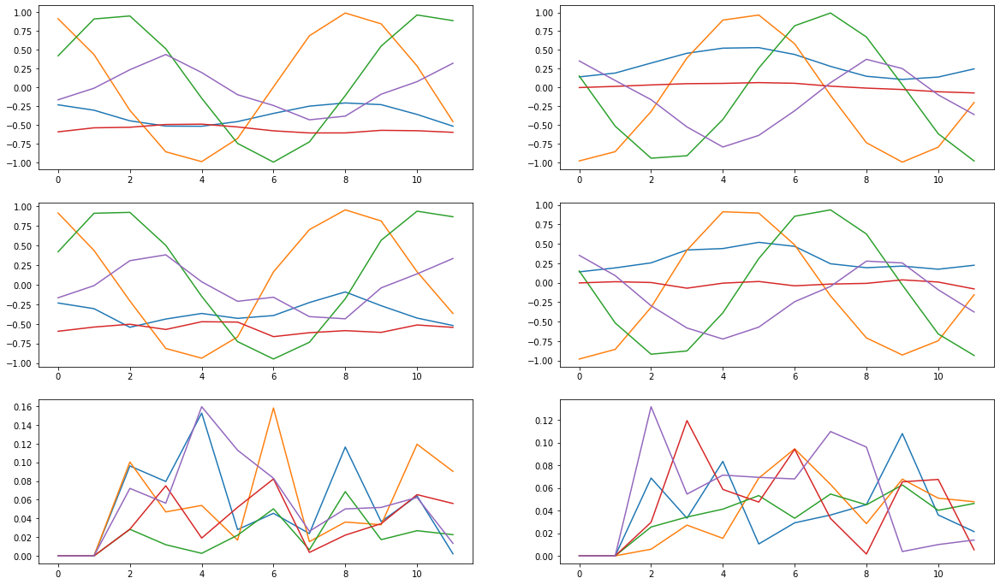

epoch: 	 0
gen loss:  1.0939656 d loss:  0.09969792 w_loss:  -0.008623693
epoch: 	 1
gen loss:  1.0576084 d loss:  0.04145085 w_loss:  0.04392869
epoch: 	 2
gen loss:  1.0639839 d loss:  0.06295965 w_loss:  0.02935403
epoch: 	 3
gen loss:  1.0315223 d loss:  0.009636093 w_loss:  0.071873866
epoch: 	 4
gen loss:  1.0730468 d loss:  0.07995792 w_loss:  0.02407966
epoch: 	 5
gen loss:  1.0686424 d loss:  0.041484486 w_loss:  0.05419581
epoch: 	 6
gen loss:  1.072478 d loss:  0.044355094 w_loss:  0.03822688
epoch: 	 7
gen loss:  1.0322584 d loss:  0.102672815 w_loss:  -0.011250824
epoch: 	 8
gen loss:  1.0261083 d loss:  0.040850334 w_loss:  0.05519104
epoch: 	 9
gen loss:  1.0669247 d loss:  0.07163145 w_loss:  0.018969802
epoch: 	 10
gen loss:  1.0406795 d loss:  0.045373637 w_loss:  0.056511473
epoch: 	 11
gen loss:  1.0546883 d loss:  0.062102146 w_loss:  0.029544046
epoch: 	 12
gen loss:  1.0538237 d loss:  0.055908106 w_loss:  0.045220993
epoch: 	 13
gen loss:  1.0446391 d loss:  0.0

Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optim

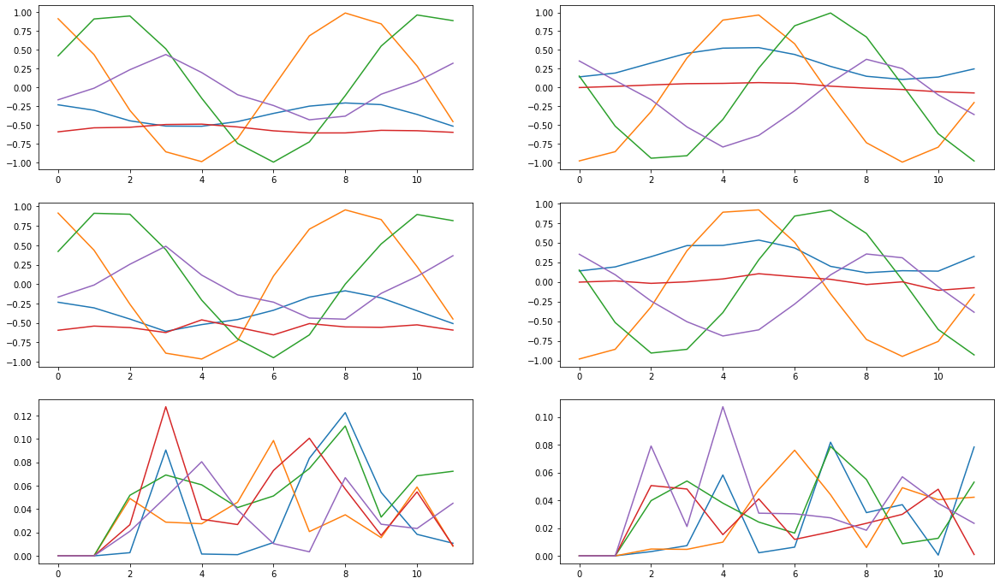

epoch: 	 0
gen loss:  1.0648985 d loss:  0.057510417 w_loss:  0.030274924
epoch: 	 1
gen loss:  1.0817403 d loss:  0.08256117 w_loss:  0.019476373
epoch: 	 2
gen loss:  1.0468357 d loss:  0.020481762 w_loss:  0.06645246
epoch: 	 3
gen loss:  1.0319331 d loss:  0.06428581 w_loss:  0.015599951
epoch: 	 4
gen loss:  1.0209016 d loss:  0.05126471 w_loss:  0.049355835
epoch: 	 5
gen loss:  1.0013937 d loss:  0.116052724 w_loss:  -0.011912026
epoch: 	 6
gen loss:  1.0391376 d loss:  0.04417927 w_loss:  0.055310953
epoch: 	 7
gen loss:  0.984814 d loss:  0.053124297 w_loss:  0.032490294
epoch: 	 8
gen loss:  1.0657811 d loss:  0.050726105 w_loss:  0.028713876
epoch: 	 9
gen loss:  1.0423455 d loss:  0.08613727 w_loss:  0.008239738
epoch: 	 10
gen loss:  1.0152851 d loss:  0.083294615 w_loss:  -0.0057018697
epoch: 	 11
gen loss:  1.0356209 d loss:  0.112937905 w_loss:  -0.023634247
epoch: 	 12
gen loss:  1.0403551 d loss:  0.08585158 w_loss:  0.00930961
epoch: 	 13
gen loss:  1.0929097 d loss:

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

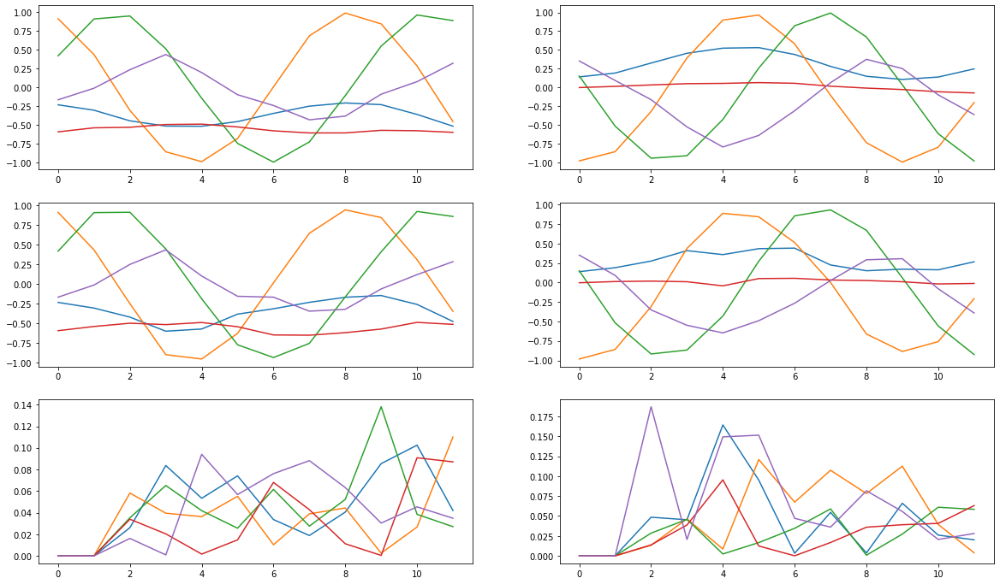

epoch: 	 0
gen loss:  1.0472267 d loss:  0.11611197 w_loss:  -0.015375592
epoch: 	 1
gen loss:  1.0385519 d loss:  0.10566546 w_loss:  -0.008790908
epoch: 	 2
gen loss:  1.0574968 d loss:  0.05347531 w_loss:  0.030869845
epoch: 	 3
gen loss:  1.0765964 d loss:  0.040811706 w_loss:  0.047097534
epoch: 	 4
gen loss:  1.0581323 d loss:  0.071039364 w_loss:  0.0071036266
epoch: 	 5
gen loss:  1.0190343 d loss:  0.107702054 w_loss:  -0.0063309297
epoch: 	 6
gen loss:  1.0042183 d loss:  0.075592436 w_loss:  0.006108611
epoch: 	 7
gen loss:  0.9993954 d loss:  0.097655855 w_loss:  -0.021615217
epoch: 	 8
gen loss:  1.0354072 d loss:  0.030686606 w_loss:  0.059830625
epoch: 	 9
gen loss:  1.0471836 d loss:  0.06251982 w_loss:  0.02660728
epoch: 	 10
gen loss:  1.0478319 d loss:  0.030825723 w_loss:  0.05212277
epoch: 	 11
gen loss:  1.027951 d loss:  0.06503098 w_loss:  0.024335634
epoch: 	 12
gen loss:  1.0077078 d loss:  0.07196881 w_loss:  0.015151359
epoch: 	 13
gen loss:  0.993528 d loss

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch:

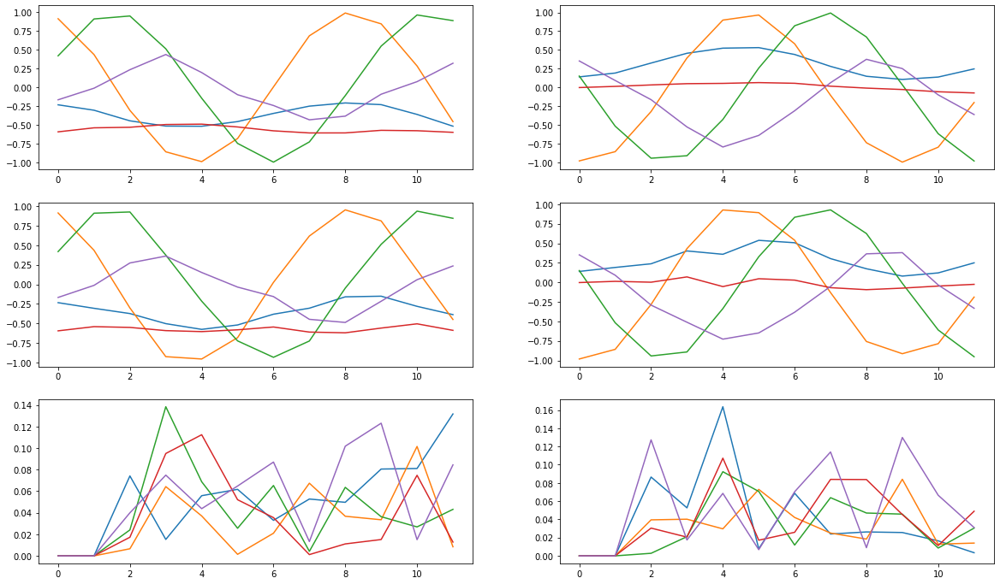

epoch: 	 0
gen loss:  1.1188222 d loss:  0.057205804 w_loss:  0.038087722
epoch: 	 1
gen loss:  1.1566536 d loss:  0.11222823 w_loss:  -0.031374373
epoch: 	 2
gen loss:  1.193358 d loss:  0.080458306 w_loss:  0.004455646
epoch: 	 3
gen loss:  1.1666596 d loss:  0.068379276 w_loss:  0.027757067
epoch: 	 4
gen loss:  1.1909845 d loss:  0.08466608 w_loss:  0.010712044
epoch: 	 5
gen loss:  1.205844 d loss:  0.07718144 w_loss:  0.01910599
epoch: 	 6
gen loss:  1.163011 d loss:  0.078720525 w_loss:  0.022002283
epoch: 	 7
gen loss:  1.1418691 d loss:  0.09555749 w_loss:  -0.0146598965
epoch: 	 8
gen loss:  1.1403824 d loss:  0.09276755 w_loss:  -0.0055802586
epoch: 	 9
gen loss:  1.1767612 d loss:  0.079716325 w_loss:  0.012228228
epoch: 	 10
gen loss:  1.1441275 d loss:  0.06150614 w_loss:  0.02088219
epoch: 	 11
gen loss:  1.2045566 d loss:  0.054924 w_loss:  0.017572619
epoch: 	 12
gen loss:  1.1867523 d loss:  0.09124525 w_loss:  -0.008968903
epoch: 	 13
gen loss:  1.1835678 d loss:  0.

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

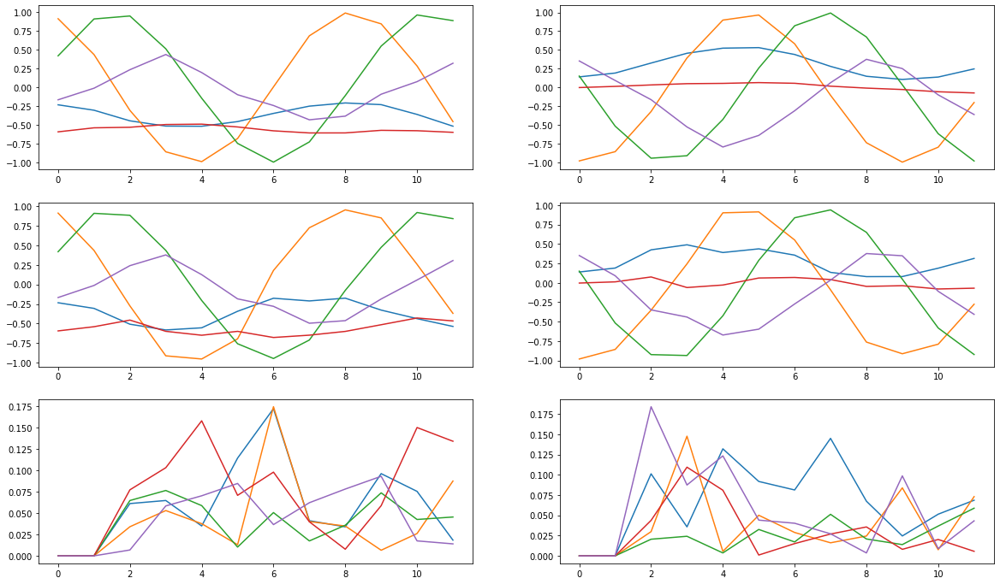

epoch: 	 0
gen loss:  1.1640403 d loss:  0.06389796 w_loss:  0.022409024
epoch: 	 1
gen loss:  1.227402 d loss:  0.07027469 w_loss:  0.026266713
epoch: 	 2
gen loss:  1.1975178 d loss:  0.11343731 w_loss:  -0.007486987
epoch: 	 3
gen loss:  1.1910837 d loss:  0.079191014 w_loss:  0.019409403
epoch: 	 4
gen loss:  1.2059306 d loss:  0.044363555 w_loss:  0.0402555
epoch: 	 5
gen loss:  1.204155 d loss:  0.08480468 w_loss:  0.015560655
epoch: 	 6
gen loss:  1.1914968 d loss:  0.03752244 w_loss:  0.05195265
epoch: 	 7
gen loss:  1.190409 d loss:  0.0711283 w_loss:  0.0040649995
epoch: 	 8
gen loss:  1.1941836 d loss:  0.041219532 w_loss:  0.040861234
epoch: 	 9
gen loss:  1.1786022 d loss:  0.06956971 w_loss:  0.0054551736
epoch: 	 10
gen loss:  1.1915863 d loss:  0.0856992 w_loss:  0.0100711575
epoch: 	 11
gen loss:  1.1992369 d loss:  0.07801239 w_loss:  0.024914267
epoch: 	 12
gen loss:  1.2129729 d loss:  0.07751976 w_loss:  0.010567022
epoch: 	 13
gen loss:  1.2064967 d loss:  0.05647

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch:

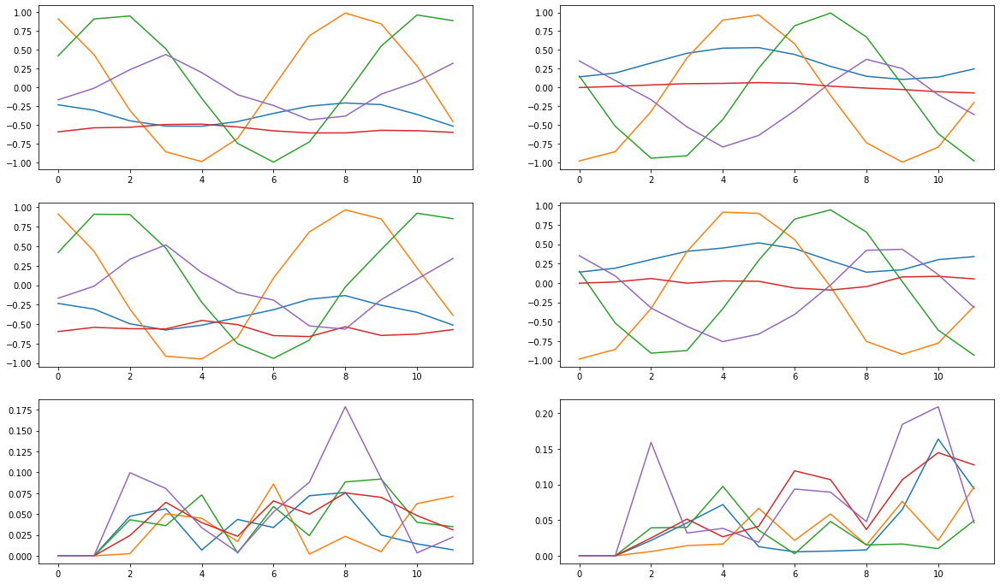

epoch: 	 0
gen loss:  1.2064179 d loss:  0.09525061 w_loss:  -0.0036135255
epoch: 	 1
gen loss:  1.1915518 d loss:  0.07964967 w_loss:  -0.002583739
epoch: 	 2
gen loss:  1.2044343 d loss:  0.094930135 w_loss:  -0.015913902
epoch: 	 3
gen loss:  1.159581 d loss:  0.046486244 w_loss:  0.035124004
epoch: 	 4
gen loss:  1.1293602 d loss:  0.06986155 w_loss:  0.016168877
epoch: 	 5
gen loss:  1.1129577 d loss:  0.03956828 w_loss:  0.06719382
epoch: 	 6
gen loss:  1.1773248 d loss:  0.091693565 w_loss:  0.0069402508
epoch: 	 7
gen loss:  1.1895819 d loss:  0.07166241 w_loss:  0.012548486
epoch: 	 8
gen loss:  1.221822 d loss:  0.010853104 w_loss:  0.07882861
epoch: 	 9
gen loss:  1.1640353 d loss:  0.057074 w_loss:  0.037527017
epoch: 	 10
gen loss:  1.1474634 d loss:  0.041208073 w_loss:  0.039420865
epoch: 	 11
gen loss:  1.1589246 d loss:  0.054308265 w_loss:  0.029196393
epoch: 	 12
gen loss:  1.1538111 d loss:  0.06670316 w_loss:  0.016483525
epoch: 	 13
gen loss:  1.1380057 d loss:  0

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch:

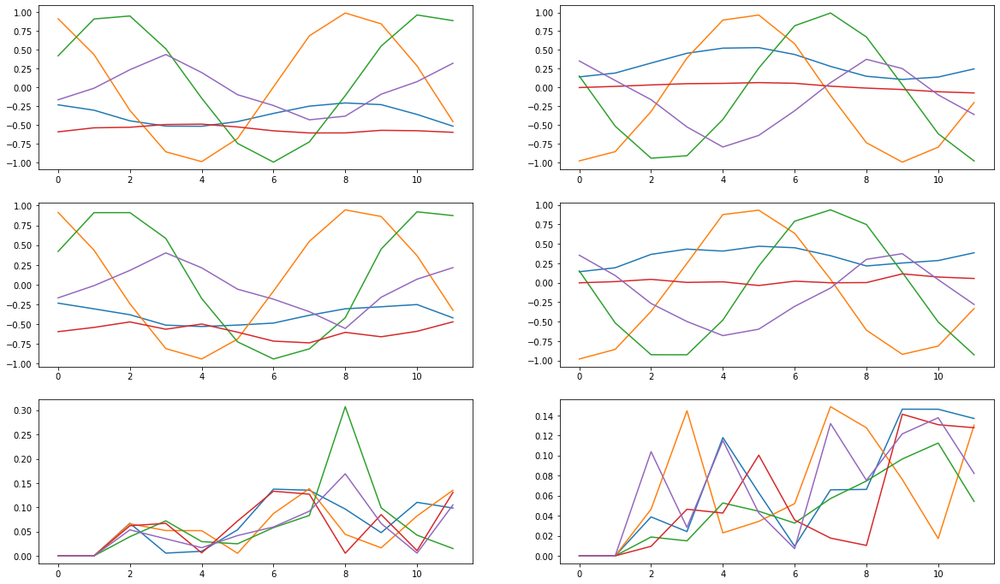

epoch: 	 0
gen loss:  1.0294508 d loss:  0.04132285 w_loss:  0.052132882
epoch: 	 1
gen loss:  0.97487104 d loss:  0.012559702 w_loss:  0.06259497
epoch: 	 2
gen loss:  1.0489469 d loss:  0.02474537 w_loss:  0.039426345
epoch: 	 3
gen loss:  1.0190073 d loss:  0.054944158 w_loss:  0.040360652
epoch: 	 4
gen loss:  1.0156851 d loss:  -0.022568502 w_loss:  0.10092493
epoch: 	 5
gen loss:  1.0207483 d loss:  0.08968005 w_loss:  -0.013043699
epoch: 	 6
gen loss:  0.9861633 d loss:  0.06700002 w_loss:  0.006225191
epoch: 	 7
gen loss:  1.0836885 d loss:  0.033296335 w_loss:  0.047885545
epoch: 	 8
gen loss:  1.0720192 d loss:  0.07226367 w_loss:  0.024781872
epoch: 	 9
gen loss:  1.1046524 d loss:  0.041805968 w_loss:  0.050037496
epoch: 	 10
gen loss:  1.0902193 d loss:  0.058396302 w_loss:  0.026349265
epoch: 	 11
gen loss:  1.091419 d loss:  0.09092683 w_loss:  -0.00078961847
epoch: 	 12
gen loss:  1.1327034 d loss:  0.0897221 w_loss:  -0.008122513
epoch: 	 13
gen loss:  1.1096685 d loss

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch:

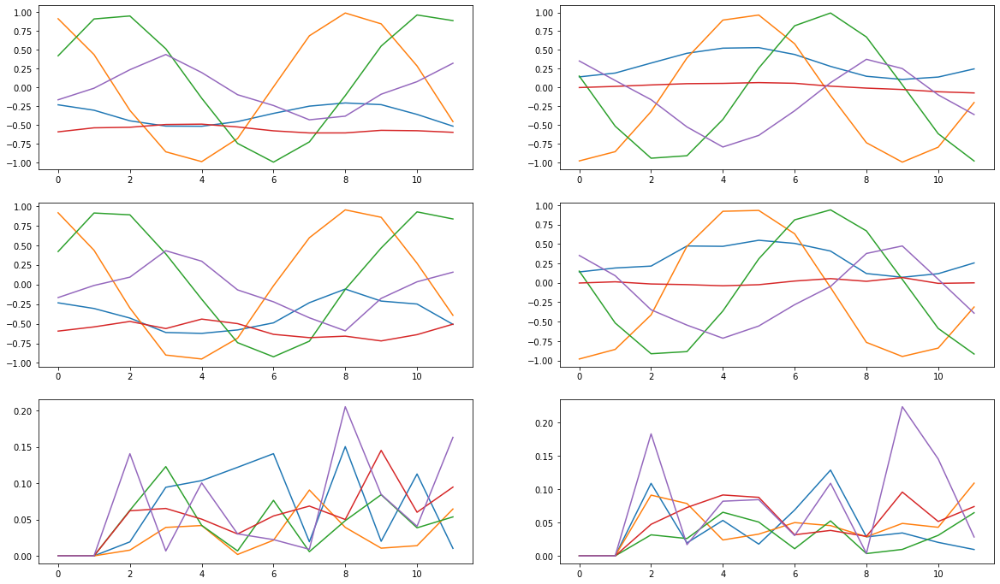

epoch: 	 0
gen loss:  1.1189655 d loss:  0.043184437 w_loss:  0.047206577
epoch: 	 1
gen loss:  1.1285346 d loss:  0.064742714 w_loss:  0.029857058
epoch: 	 2
gen loss:  1.1547618 d loss:  0.06628601 w_loss:  0.031888977
epoch: 	 3
gen loss:  1.1842768 d loss:  0.045873675 w_loss:  0.04391362
epoch: 	 4
gen loss:  1.2019087 d loss:  0.056204475 w_loss:  0.022301748
epoch: 	 5
gen loss:  1.1624223 d loss:  0.052377224 w_loss:  0.029690076
epoch: 	 6
gen loss:  1.1200439 d loss:  0.08065472 w_loss:  0.004196248
epoch: 	 7
gen loss:  1.1124376 d loss:  0.09141277 w_loss:  -0.003194894
epoch: 	 8
gen loss:  1.0683978 d loss:  0.02952149 w_loss:  0.062042557
epoch: 	 9
gen loss:  1.0887643 d loss:  0.058889933 w_loss:  0.029217988
epoch: 	 10
gen loss:  1.1105855 d loss:  0.064054824 w_loss:  0.005275759
epoch: 	 11
gen loss:  1.0956943 d loss:  0.09390255 w_loss:  -0.0047678375
epoch: 	 12
gen loss:  1.1024216 d loss:  0.07821533 w_loss:  0.013028699
epoch: 	 13
gen loss:  1.1038011 d loss

Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Do

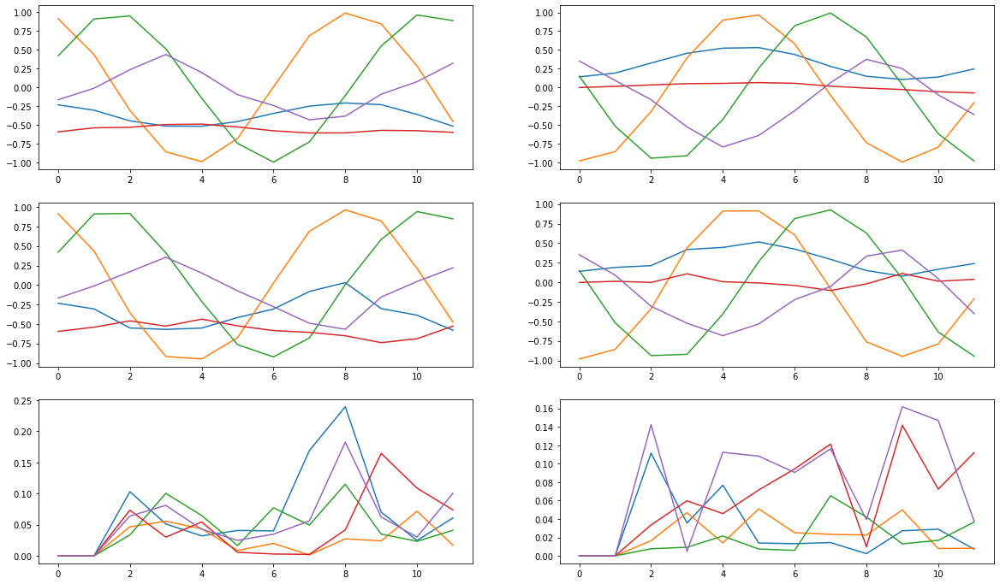

epoch: 	 0
gen loss:  1.1992887 d loss:  0.062130433 w_loss:  0.032760315
epoch: 	 1
gen loss:  1.1948318 d loss:  0.07038208 w_loss:  0.01704669
epoch: 	 2
gen loss:  1.2048866 d loss:  0.048550256 w_loss:  0.047243863
epoch: 	 3
gen loss:  1.1958456 d loss:  0.09550736 w_loss:  0.0006551586
epoch: 	 4
gen loss:  1.1609927 d loss:  0.03432771 w_loss:  0.04869423
epoch: 	 5
gen loss:  1.1268775 d loss:  0.054319013 w_loss:  0.028099876
epoch: 	 6
gen loss:  1.1494222 d loss:  0.041882373 w_loss:  0.04036928
epoch: 	 7
gen loss:  1.1404679 d loss:  0.05105754 w_loss:  0.02591685
epoch: 	 8
gen loss:  1.1475797 d loss:  0.05259154 w_loss:  0.029556846
epoch: 	 9
gen loss:  1.1778979 d loss:  0.032092277 w_loss:  0.048426025
epoch: 	 10
gen loss:  1.1829857 d loss:  0.030952865 w_loss:  0.0701075
epoch: 	 11
gen loss:  1.1373017 d loss:  0.0126724215 w_loss:  0.07241933
epoch: 	 12
gen loss:  1.1080899 d loss:  0.050856672 w_loss:  0.04526458
epoch: 	 13
gen loss:  1.1510519 d loss:  0.03

Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optim

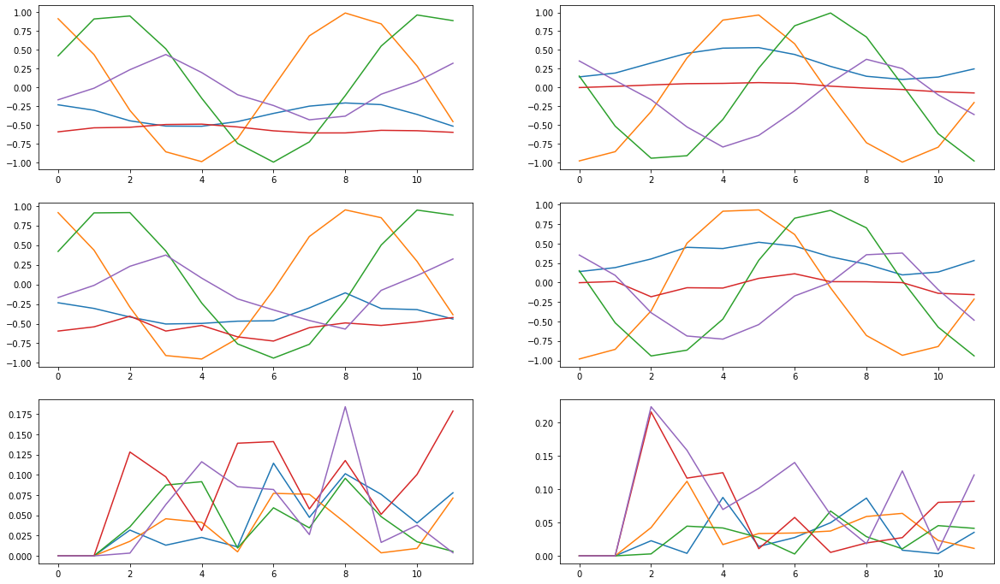

epoch: 	 0
gen loss:  1.1615307 d loss:  0.07513039 w_loss:  0.011614516
epoch: 	 1
gen loss:  1.1910565 d loss:  0.07939673 w_loss:  0.013353283
epoch: 	 2
gen loss:  1.1545047 d loss:  0.11551927 w_loss:  -0.02030901
epoch: 	 3
gen loss:  1.1501205 d loss:  0.06537013 w_loss:  0.024925906
epoch: 	 4
gen loss:  1.1588311 d loss:  0.046150807 w_loss:  0.05332117
epoch: 	 5
gen loss:  1.1590495 d loss:  0.069871016 w_loss:  0.027007163
epoch: 	 6
gen loss:  1.144581 d loss:  0.03893245 w_loss:  0.041251116
epoch: 	 7
gen loss:  1.1420592 d loss:  0.07528694 w_loss:  0.009614248
epoch: 	 8
gen loss:  1.1046846 d loss:  0.07077809 w_loss:  0.017642882
epoch: 	 9
gen loss:  1.1283414 d loss:  0.07767137 w_loss:  0.012180401
epoch: 	 10
gen loss:  1.0804406 d loss:  0.0851285 w_loss:  0.0031079412
epoch: 	 11
gen loss:  1.0893013 d loss:  0.10359051 w_loss:  -0.0020880334
epoch: 	 12
gen loss:  1.1230402 d loss:  0.121497355 w_loss:  -0.032536656
epoch: 	 13
gen loss:  1.1132777 d loss:  0.

Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Do

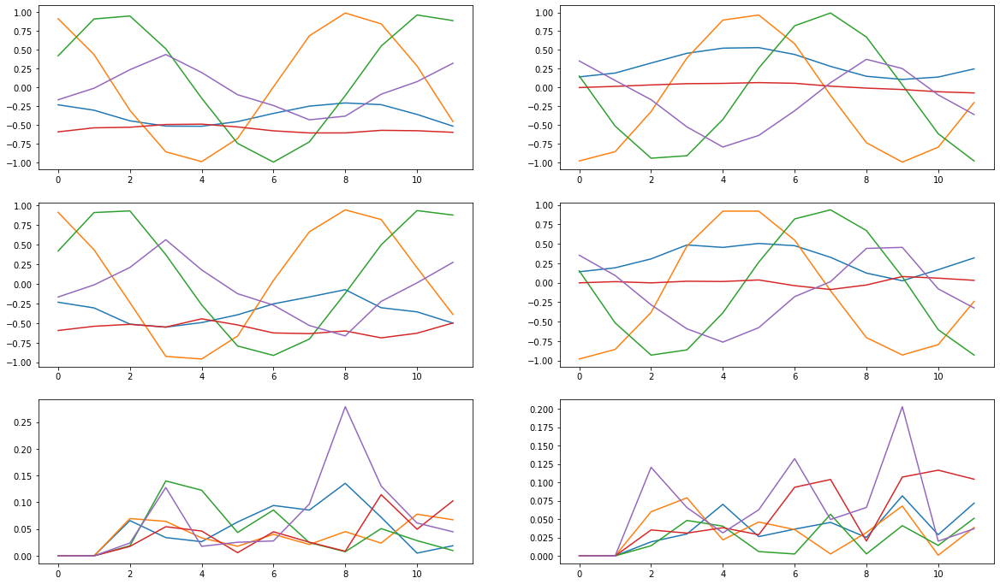

epoch: 	 0
gen loss:  1.2202699 d loss:  0.05574467 w_loss:  0.036157146
epoch: 	 1
gen loss:  1.1924341 d loss:  0.048874933 w_loss:  0.034170724
epoch: 	 2
gen loss:  1.1938567 d loss:  0.05757581 w_loss:  0.036339737
epoch: 	 3
gen loss:  1.1827548 d loss:  0.032998122 w_loss:  0.052042343
epoch: 	 4
gen loss:  1.1856292 d loss:  0.08431655 w_loss:  0.0071248775
epoch: 	 5
gen loss:  1.1416196 d loss:  0.11316569 w_loss:  -0.02219428
epoch: 	 6
gen loss:  1.1547989 d loss:  0.052146234 w_loss:  0.038808517
epoch: 	 7
gen loss:  1.1554925 d loss:  0.07580431 w_loss:  0.009724418
epoch: 	 8
gen loss:  1.1714056 d loss:  0.08255049 w_loss:  0.01873291
epoch: 	 9
gen loss:  1.1894667 d loss:  0.08539671 w_loss:  0.004878804
epoch: 	 10
gen loss:  1.2088552 d loss:  0.048441183 w_loss:  0.02851727
epoch: 	 11
gen loss:  1.204397 d loss:  0.088222496 w_loss:  0.014833575
epoch: 	 12
gen loss:  1.2597352 d loss:  0.05597108 w_loss:  0.021952892
epoch: 	 13
gen loss:  1.2553362 d loss:  0.0

Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Do

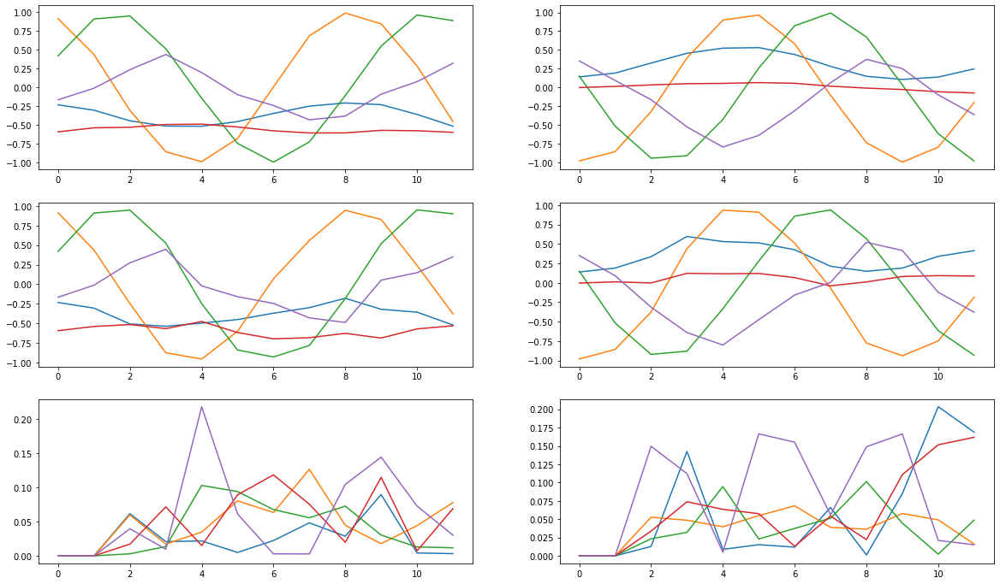

epoch: 	 0
gen loss:  1.2051879 d loss:  0.08345623 w_loss:  0.009019351
epoch: 	 1
gen loss:  1.2345512 d loss:  0.0929508 w_loss:  -0.008870434
epoch: 	 2
gen loss:  1.2011518 d loss:  0.070117414 w_loss:  0.030043405
epoch: 	 3
gen loss:  1.2087173 d loss:  0.090236306 w_loss:  -0.00072207523
epoch: 	 4
gen loss:  1.2209162 d loss:  0.07964866 w_loss:  0.015862528
epoch: 	 5
gen loss:  1.2289863 d loss:  0.08032823 w_loss:  -0.0035507441
epoch: 	 6
gen loss:  1.2419951 d loss:  0.048086636 w_loss:  0.038289428
epoch: 	 7
gen loss:  1.2795368 d loss:  0.024516167 w_loss:  0.06458328
epoch: 	 8
gen loss:  1.2775048 d loss:  0.030265529 w_loss:  0.07513694
epoch: 	 9
gen loss:  1.2631193 d loss:  0.04137417 w_loss:  0.038369864
epoch: 	 10
gen loss:  1.2390898 d loss:  0.06999694 w_loss:  0.02709192
epoch: 	 11
gen loss:  1.2181925 d loss:  0.078932114 w_loss:  0.020027405
epoch: 	 12
gen loss:  1.2374686 d loss:  0.0759172 w_loss:  0.012748974
epoch: 	 13
gen loss:  1.2181953 d loss: 

Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Do

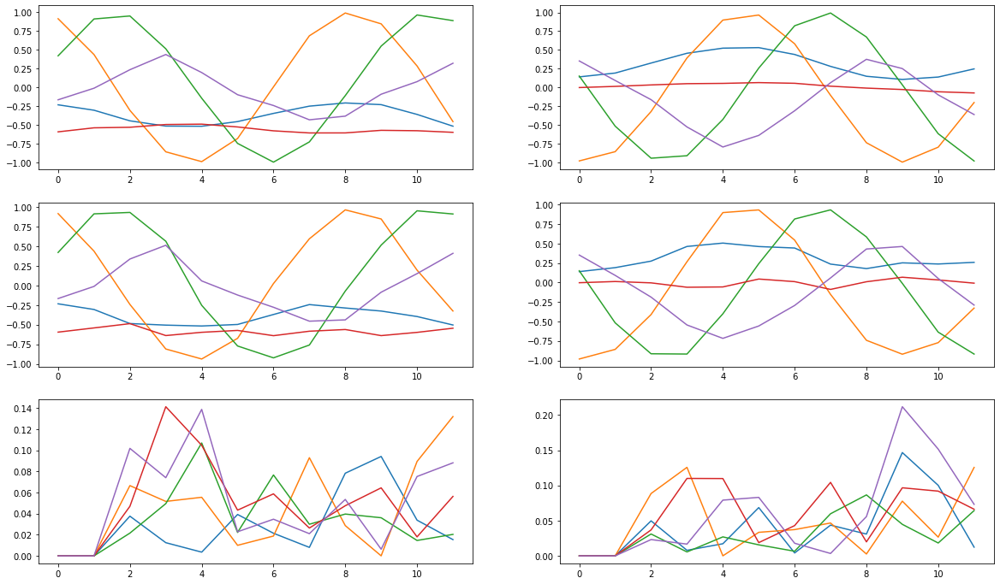

epoch: 	 0
gen loss:  1.2088449 d loss:  0.09131341 w_loss:  0.004154601
epoch: 	 1
gen loss:  1.2295231 d loss:  0.038361896 w_loss:  0.037727073
epoch: 	 2
gen loss:  1.1914316 d loss:  0.083558336 w_loss:  -0.003033673
epoch: 	 3
gen loss:  1.1855705 d loss:  0.08213945 w_loss:  0.016470462
epoch: 	 4
gen loss:  1.1708927 d loss:  0.08697665 w_loss:  0.014364263
epoch: 	 5
gen loss:  1.1570104 d loss:  0.055959433 w_loss:  0.030067846
epoch: 	 6
gen loss:  1.170102 d loss:  0.09051083 w_loss:  -0.009238042
epoch: 	 7


KeyboardInterrupt: 

In [16]:
for i in range(50):
    kwargs_opt = {
        "start_from" : 700,
        "nPOD" : nPOD,
        "nLatent" : 100,
        "npredictions" : 10,
        "optimizer_epochs" : 50,
        "dt" : step_size,
        "gan" : gan,
        "cycles" : 10,
        "debug" : debug,
        "disturb" : True
    }

    optimizer = Optimize(**kwargs_opt)
    fld = optimizer.predictDD(training_data,
                               tf.convert_to_tensor(np.array(boundrary_conditions, dtype=np.float32)),
                               dim_steps=added_dims)

    show_dims = 5
    fig = plt.figure(figsize=(20, 12))

    ax1 = fig.add_subplot(321)
    ax1.plot(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:show_dims])
    ax1 = fig.add_subplot(323)
    ax1.plot(fld[0, :, :show_dims])
    ax1 = fig.add_subplot(325)
    ax1.plot(np.abs(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld[0,:, :show_dims]))


    ax1 = fig.add_subplot(322)
    ax1.plot(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims])
    ax1 = fig.add_subplot(324)
    ax1.plot(fld[1, :, :show_dims])
    ax1 = fig.add_subplot(326)
    ax1.plot(np.abs(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld[1, :, :show_dims]))

    plt.show()
    
    gan.resume_training(joined_train_data, 0)

Time step: 	 0
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Do

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 11
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 21
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch

Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 31
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Opti

Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 41
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Opti

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 51
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 61
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch

Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 71
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Opti

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 81
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 82
Cycle: 	 0
Domain: 	 0

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 91
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 92
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1

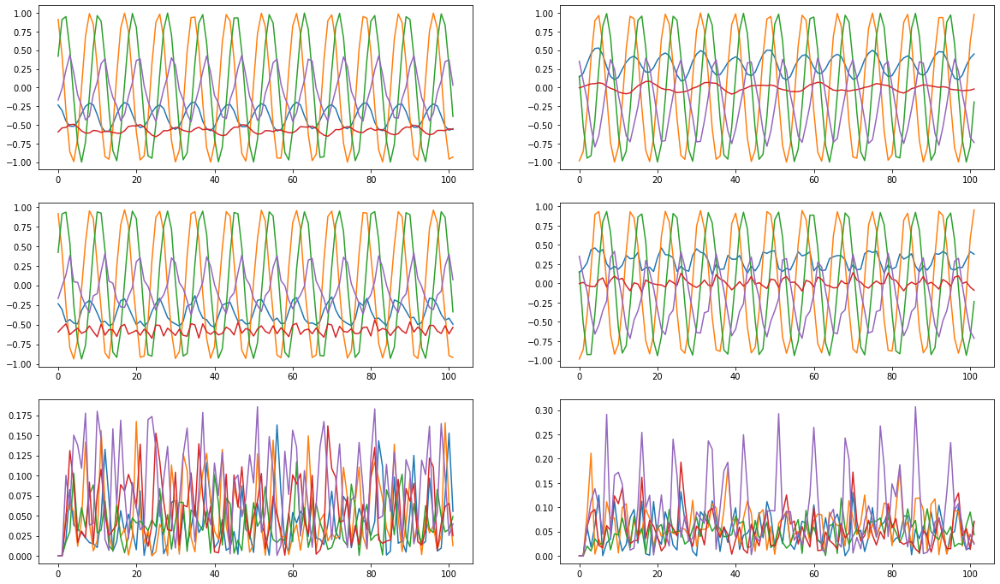

In [18]:
kwargs_opt = {
    "start_from" : 700,
    "nPOD" : nPOD,
    "nLatent" : 100,
    "npredictions" : 100,
    "optimizer_epochs" : 50,
    "dt" : step_size,
    "gan" : gan,
    "cycles" : 10,
    "debug" : debug,
    "disturb" : True
}

optimizer = Optimize(**kwargs_opt)
fld = optimizer.predictDD(training_data,
                           tf.convert_to_tensor(np.array(boundrary_conditions, dtype=np.float32)),
                           dim_steps=added_dims)

show_dims = 5
fig = plt.figure(figsize=(20, 12))

ax1 = fig.add_subplot(321)
ax1.plot(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:show_dims])
ax1 = fig.add_subplot(323)
ax1.plot(fld[0, :, :show_dims])
ax1 = fig.add_subplot(325)
ax1.plot(np.abs(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld[0,:, :show_dims]))


ax1 = fig.add_subplot(322)
ax1.plot(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims])
ax1 = fig.add_subplot(324)
ax1.plot(fld[1, :, :show_dims])
ax1 = fig.add_subplot(326)
ax1.plot(np.abs(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld[1, :, :show_dims]))

plt.show()

Time step: 	 0
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 3
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 4
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer e

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 41
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 42
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 43
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 44
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 45
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimi

Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 82
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 83
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 84
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 85
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 86
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimi

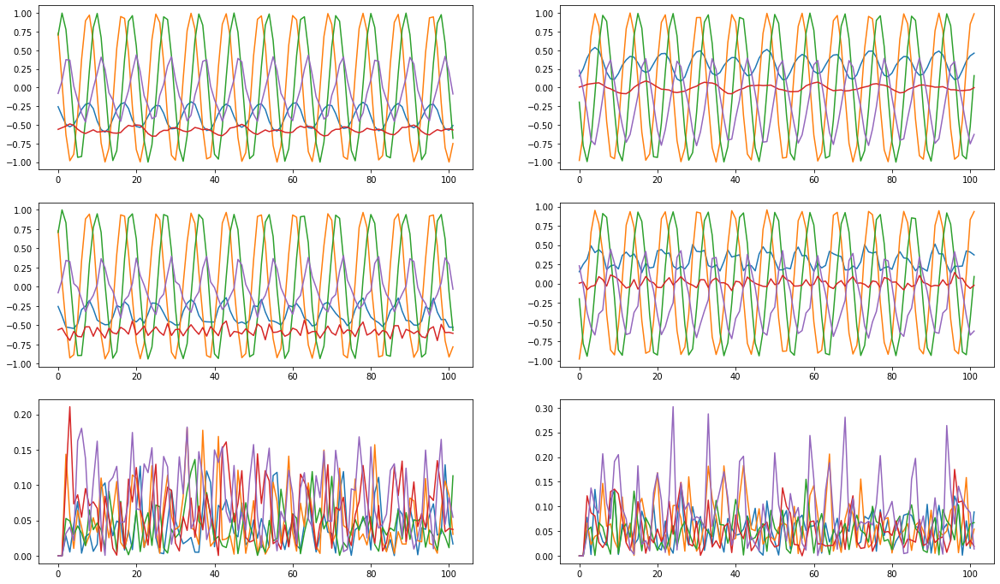

In [20]:
kwargs_opt = {
    "start_from" : 702,
    "nPOD" : nPOD,
    "nLatent" : 100,
    "npredictions" : 100,
    "optimizer_epochs" : 100,
    "dt" : step_size,
    "gan" : gan,
    "cycles" : 2,
    "debug" : debug,
    "disturb" : True
}

optimizer = Optimize(**kwargs_opt)
fld1 = optimizer.predictDD(training_data,
                           tf.convert_to_tensor(np.array(boundrary_conditions, dtype=np.float32)),
                           dim_steps=added_dims)

show_dims = 5
fig = plt.figure(figsize=(20, 12))

ax1 = fig.add_subplot(321)
ax1.plot(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:show_dims])
ax1 = fig.add_subplot(323)
ax1.plot(fld1[0, :, :show_dims])
ax1 = fig.add_subplot(325)
ax1.plot(np.abs(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld1[0,:, :show_dims]))


ax1 = fig.add_subplot(322)
ax1.plot(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims])
ax1 = fig.add_subplot(324)
ax1.plot(fld1[1, :, :show_dims])
ax1 = fig.add_subplot(326)
ax1.plot(np.abs(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld1[1, :, :show_dims]))

plt.show()

In [22]:
a=np.reshape(np.ravel([fld[0],fld1[0]], "F"),[10,-1]).T
b=np.reshape(np.ravel([fld[1],fld1[1]], "F"),[10,-1]).T

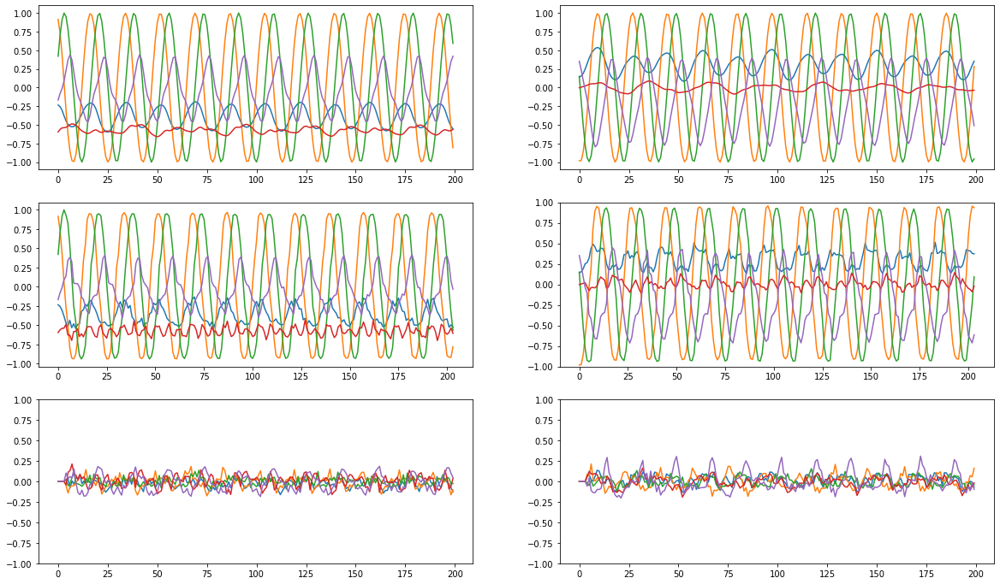

In [24]:
fig = plt.figure(figsize=(20, 12))
start = 700

ax1 = fig.add_subplot(321)
ax1.plot(scaled_training[1, start:start + 100*4:2, :show_dims])
ax1 = fig.add_subplot(323)
ax1.plot(a[:,:show_dims])
ax1 = fig.add_subplot(325)
ax1.plot(scaled_training[1, start:start + 100*4:2, :show_dims]- a[:200,:show_dims])
ax1.set_ylim([-1,1])

ax1 = fig.add_subplot(322)
ax1.plot(scaled_training[2, start:start + 100*4:2, :show_dims])
ax1 = fig.add_subplot(324)
ax1.plot(b[:,:show_dims])
plt.ylim([-1,1])
ax1 = fig.add_subplot(326)
ax1.plot(scaled_training[2, start:start + 100*4:2, :show_dims]- b[:200,:show_dims])
ax1.set_ylim([-1,1])

plt.show()

In [25]:
a1 = scales[1].inverse_transform(a)
b1 = scales[2].inverse_transform(b)

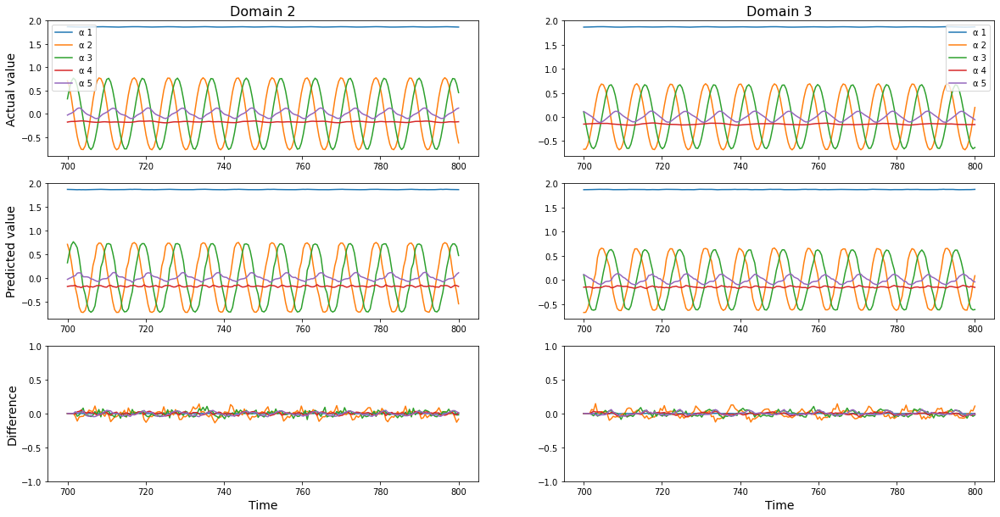

In [49]:
show_dims
xaxis = np.linspace(start, start+100, 200)

fig = plt.figure(figsize=(20, 10))

ax1 = fig.add_subplot(321)
ax1.set_title('Domain 2',fontsize=16)
for i in range(show_dims):
    ax1.plot(xaxis, scales[1].inverse_transform(scaled_training[1, start:start + 100*4:2])[:,i], label = 'α ' + str(i+1))
ax1.set_ylabel('Actual value',fontsize=14)
ax1.legend()
ax1 = fig.add_subplot(323)
ax1.plot(xaxis, a1[:200,:show_dims])
ax1.set_ylabel('Predicted value',fontsize=14)
ax1 = fig.add_subplot(325)
ax1.plot(xaxis, scales[1].inverse_transform(scaled_training[1, start:start + 100*4:2])[:,:show_dims]- a1[:200,:show_dims])
ax1.set_ylabel('Difference',fontsize=14)
ax1.set_xlabel('Time',fontsize=14)
ax1.set_ylim([-1,1])

ax1 = fig.add_subplot(322)
ax1.set_title('Domain 3',fontsize=16)
for i in range(show_dims):
    ax1.plot(xaxis, scales[2].inverse_transform(scaled_training[2, start:start + 100*4:2])[:,i], label = 'α ' + str(i+1))
ax1.legend()
ax1 = fig.add_subplot(324)
ax1.plot(xaxis, b1[:200,:show_dims])
ax1 = fig.add_subplot(326)
ax1.plot(xaxis, scales[2].inverse_transform(scaled_training[2, start:start + 100*4:2])[:,:show_dims]- b1[:200,:show_dims])
ax1.set_xlabel('Time',fontsize=14)
ax1.set_ylim([-1,1])

plt.show()

In [ ]:
fig = plt.figure(figsize=(15, 9))

ax = fig.add_subplot(111)    # The big subplot

# Turn off axis lines and ticks of the big subplot
ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)


ax1 = fig.add_subplot(411)
ax1.set_title('Domain 1')
ax1.plot(np.linspace(0,125,500),csv_data[0,:5,:500].T)

ax1 = fig.add_subplot(412)
ax1.set_title('Domain 2')
ax1.plot(np.linspace(0,125,500),csv_data[1,:5,:500].T)

ax1 = fig.add_subplot(413)
ax1.set_title('Domain 3')
ax1.plot(np.linspace(0,125,500),csv_data[2,:5,:500].T)

ax1 = fig.add_subplot(414)
ax1.set_title('Domain 4')
ax1.plot(np.linspace(0,125,500),csv_data[3,:5,:500].T)
ax1.set_xlabel('Time',fontsize=14)
ax.set_ylabel('Value',fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
pause

In [ ]:
basis = np.load('../data/processed/DD/pod_basis_field_Velocity.npy')

In [ ]:
final_data = []
rect = 18
final_data.append(scales[0].inverse_transform((scaled_training[0,optimizer.start_from+rect:rect+optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:nPOD])).T)
for i in range(2):
    final_data.append(scales[1+i].inverse_transform(flds[i]).T)
    
final_data.append(scales[3].inverse_transform((scaled_training[3,optimizer.start_from+rect:rect+optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:nPOD])).T)

In [ ]:
org_data = []
for i in range(4):
    org_data.append(scales[i].inverse_transform((scaled_training[i,optimizer.start_from+rect:rect+optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:nPOD])).T)

In [ ]:
cutoff = 40
final_data = np.array(final_data)[:,:,:cutoff]
org_data = np.array(org_data)[:,:,:cutoff]

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax1 = fig.add_subplot(411)
ax1.plot(final_data[0].T)
ax1 = fig.add_subplot(412)
ax1.plot(final_data[1].T)
ax1 = fig.add_subplot(413)
ax1.plot(final_data[2].T)
ax1 = fig.add_subplot(414)
ax1.plot(final_data[3].T)

plt.show()

In [ ]:
print_data = []

for i in range(4):
    print_data.append((basis[:,:gan.ndims] @ final_data[i]))

print_data = np.array(print_data).reshape([4, 2, 55, 42, 40])
np.save('../data/reconstructed/Velocity_field_predict_DD.npy', print_data )

In [ ]:
org_data_re = []

for i in range(4):
    org_data_re.append(basis[:,:gan.ndims] @ org_data[i])

org_data_re = np.array(org_data_re).reshape([4, 2, 55, 42, 40])
np.save('../data/reconstructed/velocity_field_org_DD.npy', org_data_re )

## 